### Импорт библиотек

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.impute import SimpleImputer

from prophet import Prophet

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, GRU, Dense, Input, MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX

warnings.filterwarnings("ignore")

In [2]:
pip install numpy pandas matplotlib scikit-learn tensorflow prophet statsmodels pmdarima

### Данные

In [3]:
file_url = "https://drive.google.com/uc?id=1Rn3-XWfgK-fs7-8G2HM9bkLQ9utTA4wJ"
data = pd.read_csv(file_url)

In [4]:
first_tier_tickers = ["SBER", "SBERP", "ROSN",  "SIBN", "NVTK", "LKOH", "GAZP",
                      "PLZL", "TATN", "TATNP", "SNGS", "SNGSP", "CHMF", "NLMK"]

data = data[data['TICKER'].isin(first_tier_tickers)]

In [5]:
data.head()

,TRADEDATE,OPEN,HIGH,LOW,CLOSE,VOLUME,TICKER
0,2023-10-30,269.90,271.55,268.60,269.89,33345990,SBER
1,2023-10-31,270.00,270.50,266.87,268.35,26210450,SBER
2,2023-11-01,268.29,270.30,267.60,269.68,20609480,SBER
3,2023-11-02,270.00,270.98,268.50,269.06,25751530,SBER
4,2023-11-03,269.07,269.78,267.20,268.54,20981280,SBER


In [6]:
data = data[data['TICKER'].isin(first_tier_tickers)]

In [7]:
data['TRADEDATE'] = pd.to_datetime(data['TRADEDATE'])

In [8]:
data.isnull().sum()

,0
TRADEDATE,0
OPEN,0
HIGH,0
LOW,0
CLOSE,0
VOLUME,0
TICKER,0


In [9]:
data_cleaned = data.dropna()

print(data_cleaned.isnull().sum())


TRADEDATE    0
OPEN         0
HIGH         0
LOW          0
CLOSE        0
VOLUME       0
TICKER       0
dtype: int64


In [10]:
data_filled = data.fillna(method='ffill')

print(data_filled.isnull().sum())

TRADEDATE    0
OPEN         0
HIGH         0
LOW          0
CLOSE        0
VOLUME       0
TICKER       0
dtype: int64


In [11]:
file_url = "https://drive.google.com/uc?id=1Rn3-XWfgK-fs7-8G2HM9bkLQ9utTA4wJ"
data = pd.read_csv(file_url)

first_tier_tickers = ["SBER", "SBERP", "ROSN",  "SIBN", "NVTK", "LKOH", "GAZP", "GMKN",
                      "PLZL", "TATN", "TATNP", "YDEX", "SNGS", "SNGSP", "CHMF", "NLMK"]
data = data[data['TICKER'].isin(first_tier_tickers)]
data['TRADEDATE'] = pd.to_datetime(data['TRADEDATE'])

def prepare_data(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

### Построение бейзлайна с использованием сезонного наивного метода

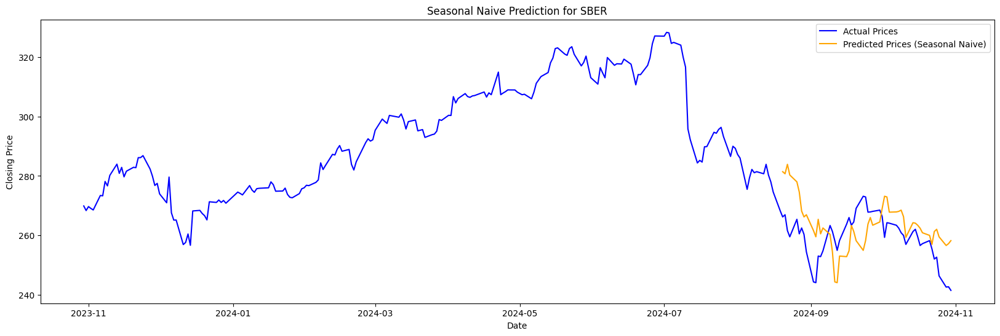

Результаты для SBER:
  MSE = 109.25573653846162
  MAE = 8.87519230769231
  RMSE = 10.452546892430648
  MAPE = 0.03%
  R² = -0.9033439475809286



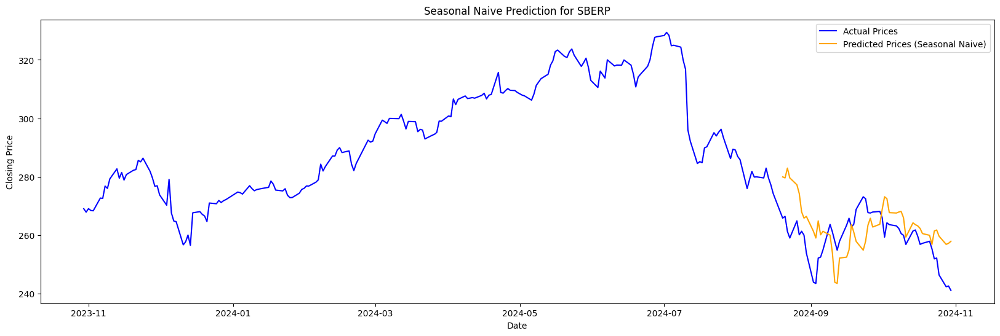

Результаты для SBERP:
  MSE = 108.09658461538463
  MAE = 8.86423076923077
  RMSE = 10.396950736412318
  MAPE = 0.03%
  R² = -0.8902564382302809



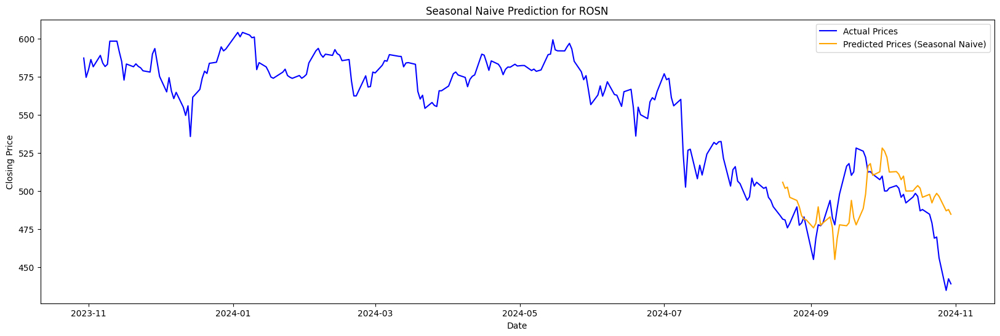

Результаты для ROSN:
  MSE = 501.80668269230745
  MAE = 17.706730769230766
  RMSE = 22.401042000146052
  MAPE = 0.04%
  R² = -0.14986005096217436



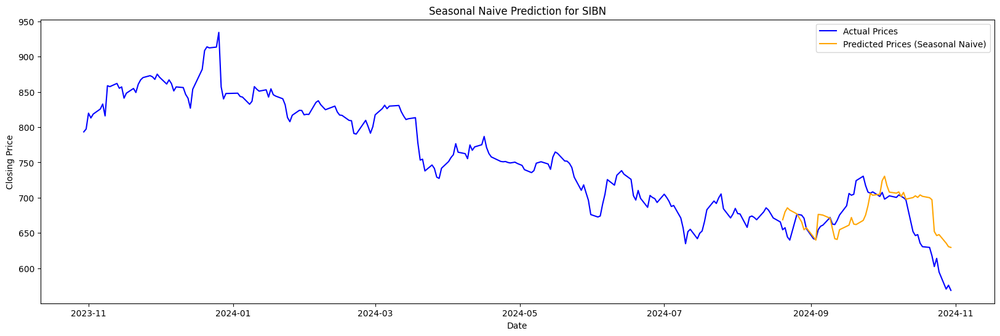

Результаты для SIBN:
  MSE = 1365.0027884615386
  MAE = 28.42115384615384
  RMSE = 36.94594414088695
  MAPE = 0.04%
  R² = 0.12898660742949475



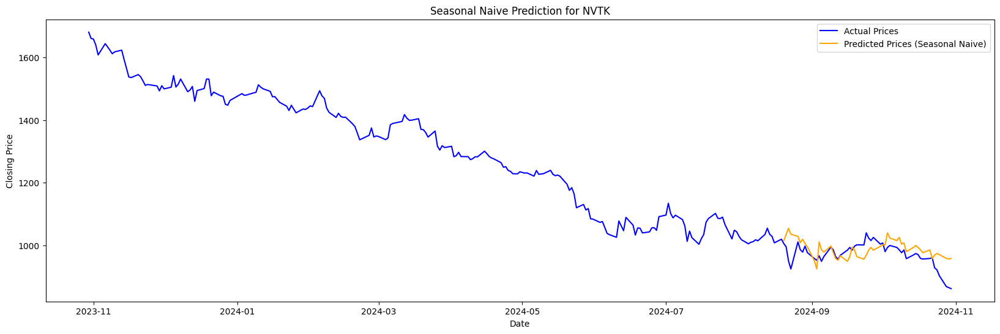

Результаты для NVTK:
  MSE = 1775.069230769231
  MAE = 32.5923076923077
  RMSE = 42.131570475941565
  MAPE = 0.03%
  R² = -0.26242838255039125



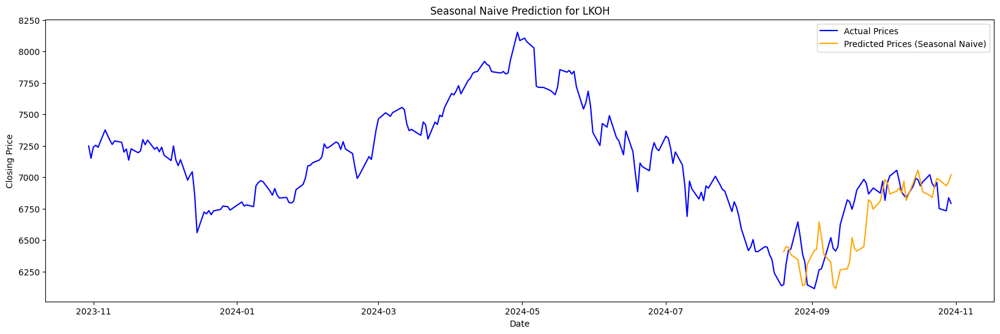

Результаты для LKOH:
  MSE = 54894.596153846156
  MAE = 186.82692307692307
  RMSE = 234.2959584667353
  MAPE = 0.03%
  R² = 0.3034301195951359



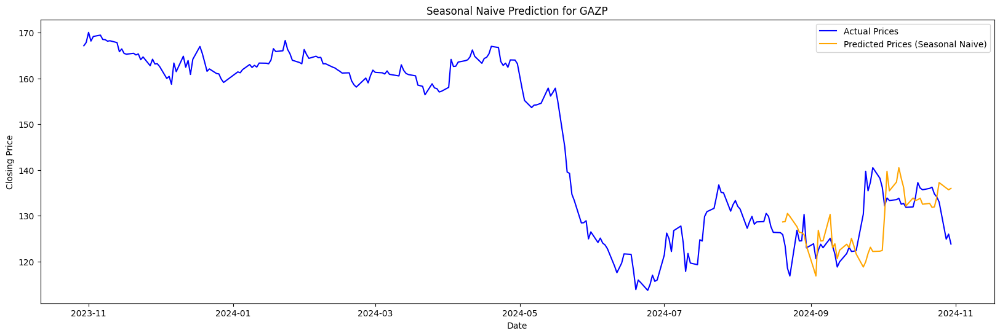

Результаты для GAZP:
  MSE = 53.80940192307693
  MAE = 5.274423076923079
  RMSE = 7.335489208163075
  MAPE = 0.04%
  R² = -0.30454278838277005



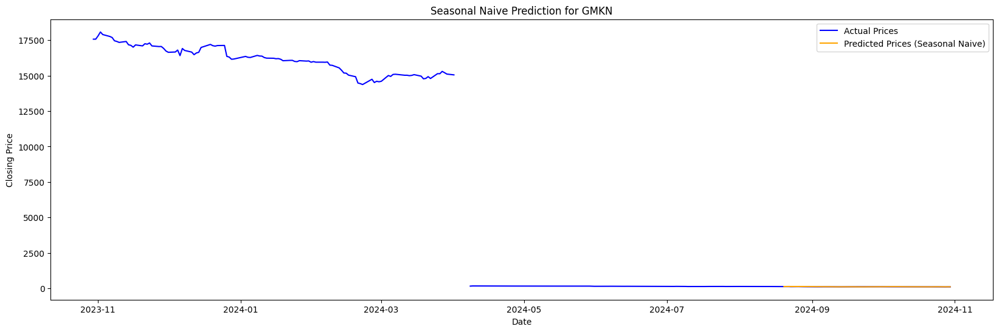

Результаты для GMKN:
  MSE = 54.443061538461556
  MAE = 6.080769230769231
  RMSE = 7.378554163144806
  MAPE = 0.06%
  R² = -0.6954385135506815



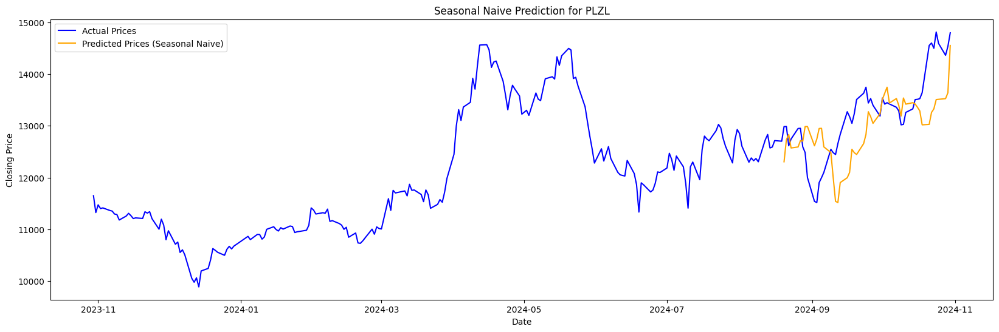

Результаты для PLZL:
  MSE = 536453.9663461539
  MAE = 588.7788461538462
  RMSE = 732.4301784785727
  MAPE = 0.04%
  R² = 0.13846274464102792



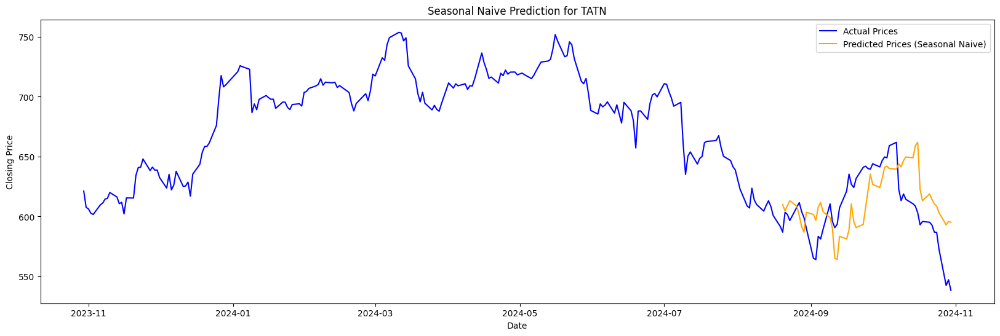

Результаты для TATN:
  MSE = 829.6242307692311
  MAE = 25.03461538461539
  RMSE = 28.803198273268734
  MAPE = 0.04%
  R² = -0.012741775311244208



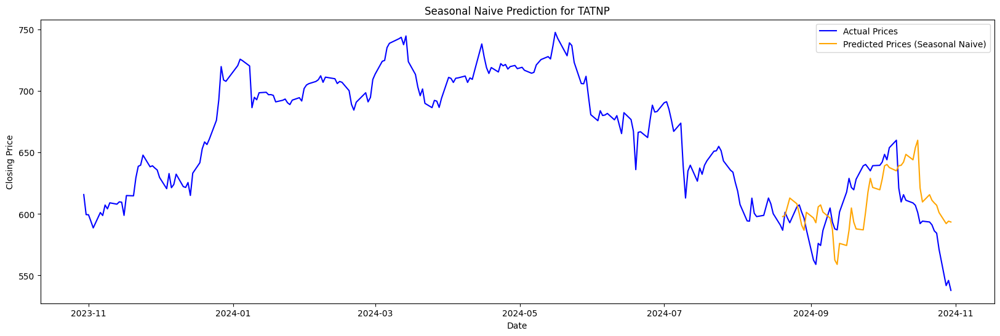

Результаты для TATNP:
  MSE = 819.756923076923
  MAE = 24.73076923076923
  RMSE = 28.631397504783504
  MAPE = 0.04%
  R² = -0.02881164774763656



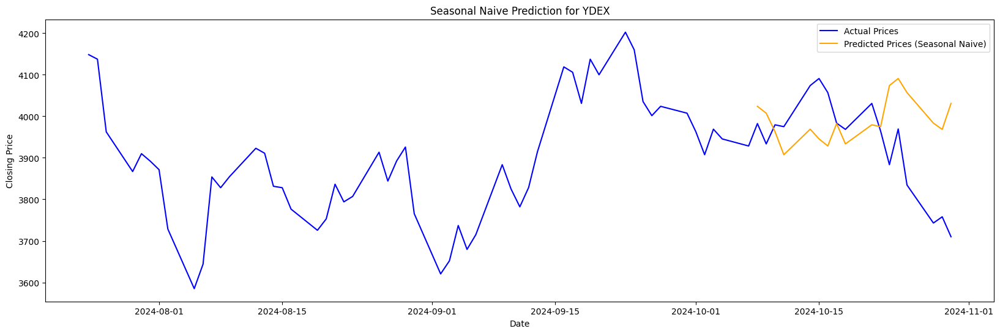

Результаты для YDEX:
  MSE = 21792.529411764706
  MAE = 116.6470588235294
  RMSE = 147.62292983058123
  MAPE = 0.03%
  R² = -0.7592150789839969



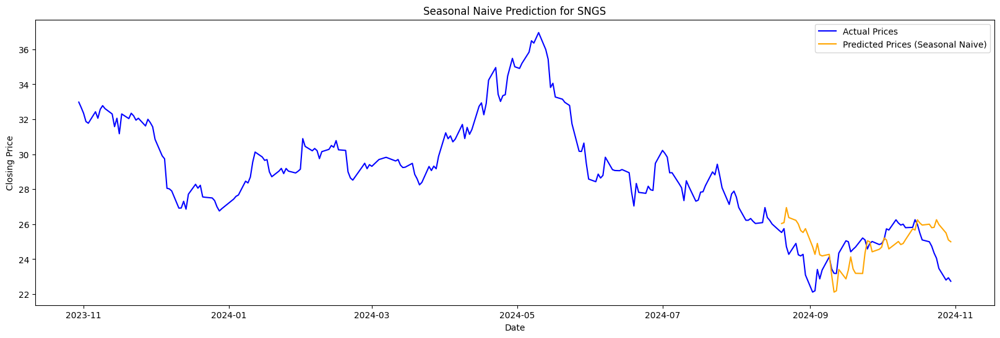

Результаты для SNGS:
  MSE = 1.9652855769230775
  MAE = 1.182115384615385
  RMSE = 1.4018864351020297
  MAPE = 0.05%
  R² = -0.670797992366382



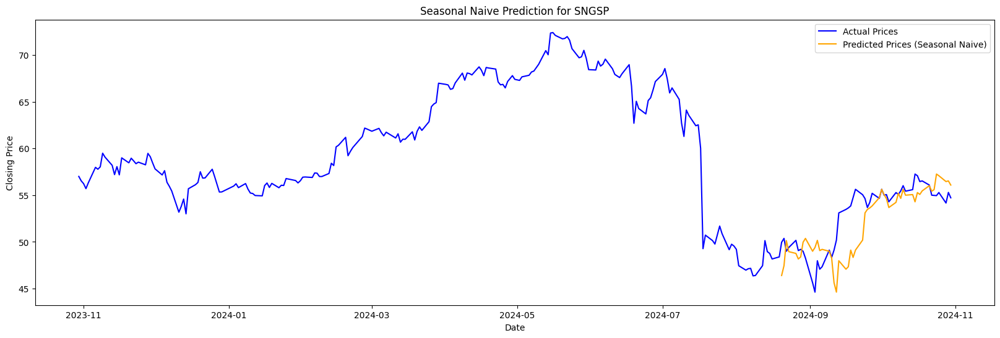

Результаты для SNGSP:
  MSE = 7.656996634615382
  MAE = 1.9914423076923078
  RMSE = 2.767127867413319
  MAPE = 0.04%
  R² = 0.30679694740633134



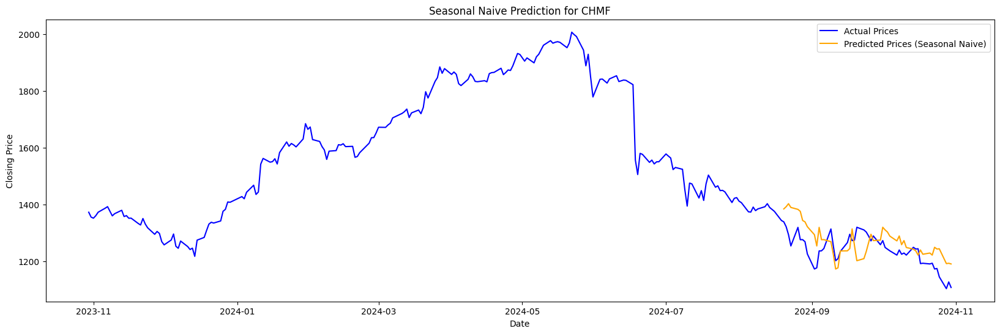

Результаты для CHMF:
  MSE = 3981.633076923077
  MAE = 54.60384615384616
  RMSE = 63.100182859664336
  MAPE = 0.04%
  R² = -0.36582722443473625



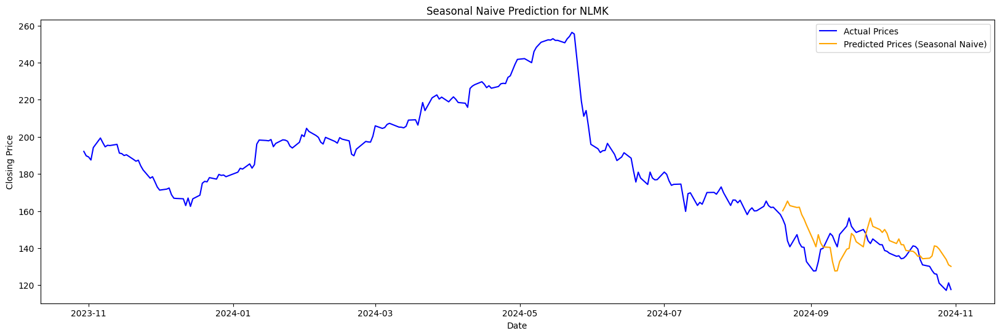

Результаты для NLMK:
  MSE = 135.5605076923077
  MAE = 10.151538461538463
  RMSE = 11.64304546466721
  MAPE = 0.07%
  R² = -0.5538383066679236



In [12]:
def seasonal_naive_baseline(ticker_data, seasonal_period=7):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values
    dates = ticker_data['TRADEDATE'].values

    if len(ticker_data_values) < seasonal_period:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} has insufficient data for the given seasonal period. Skipping this ticker.")
        return None

    try:
        train_size = int(len(ticker_data_values) * 0.8)
        train, test = ticker_data_values[:train_size], ticker_data_values[train_size:]
        predictions = []
        for i in range(len(test)):
            if i < seasonal_period:
                predictions.append(train[-seasonal_period + i])
            else:
                predictions.append(test[i - seasonal_period])

        mse = mean_squared_error(test, predictions)
        mae = mean_absolute_error(test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(test, predictions)
        r2 = r2_score(test, predictions)

        test_dates = dates[train_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (Seasonal Naive)', color='orange')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'Seasonal Naive Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

seasonal_naive_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = seasonal_naive_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2 = result
            seasonal_naive_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Результаты для {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")



In [13]:
print("\nSeasonal Naive Model Results Summary:")
for ticker, metrics in seasonal_naive_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


Seasonal Naive Model Results Summary:
SBER: MSE = 109.25573653846162, MAE = 8.87519230769231, RMSE = 10.452546892430648, MAPE = 0.03%, R² = -0.9033439475809286
SBERP: MSE = 108.09658461538463, MAE = 8.86423076923077, RMSE = 10.396950736412318, MAPE = 0.03%, R² = -0.8902564382302809
ROSN: MSE = 501.80668269230745, MAE = 17.706730769230766, RMSE = 22.401042000146052, MAPE = 0.04%, R² = -0.14986005096217436
SIBN: MSE = 1365.0027884615386, MAE = 28.42115384615384, RMSE = 36.94594414088695, MAPE = 0.04%, R² = 0.12898660742949475
NVTK: MSE = 1775.069230769231, MAE = 32.5923076923077, RMSE = 42.131570475941565, MAPE = 0.03%, R² = -0.26242838255039125
LKOH: MSE = 54894.596153846156, MAE = 186.82692307692307, RMSE = 234.2959584667353, MAPE = 0.03%, R² = 0.3034301195951359
GAZP: MSE = 53.80940192307693, MAE = 5.274423076923079, RMSE = 7.335489208163075, MAPE = 0.04%, R² = -0.30454278838277005
GMKN: MSE = 54.443061538461556, MAE = 6.080769230769231, RMSE = 7.378554163144806, MAPE = 0.06%, R² = -

### Реализация с помощью экспоненциальное сглаживание (Holt-Winters)

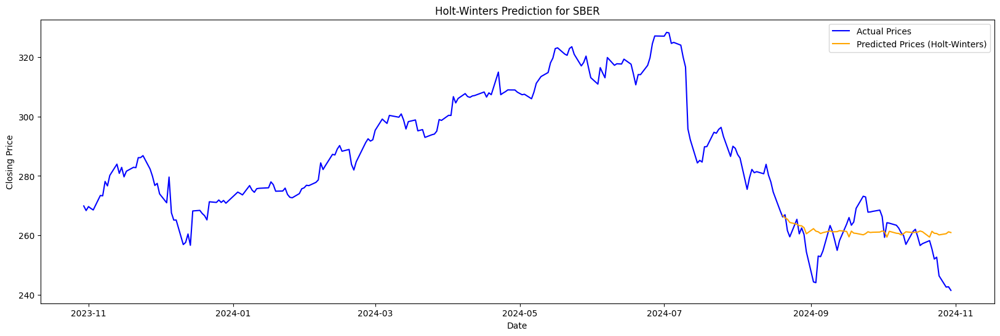

Результаты для SBER:
  MSE = 60.405889349875515
  MAE = 5.807354361871349
  RMSE = 7.772122576868916
  MAPE = 0.02%
  R² = -0.05233086641500506



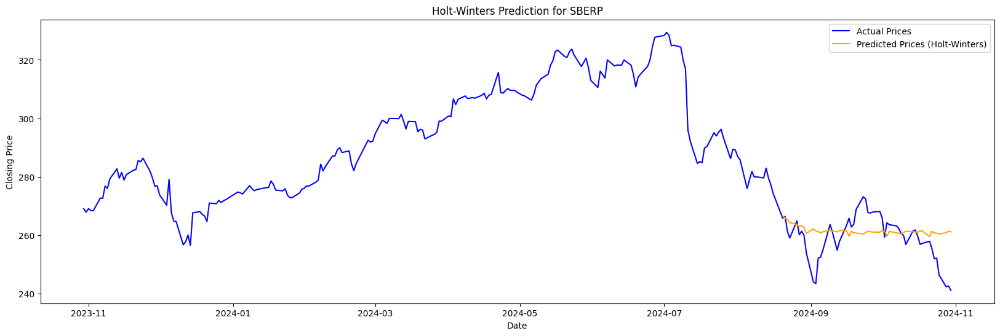

Результаты для SBERP:
  MSE = 61.88908952926189
  MAE = 5.838278651560676
  RMSE = 7.866961899568466
  MAPE = 0.02%
  R² = -0.08223817019883639



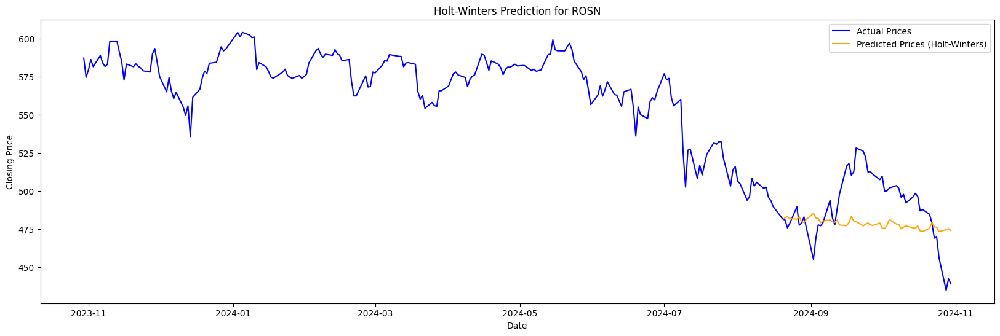

Результаты для ROSN:
  MSE = 553.68476212126
  MAE = 18.986597276727935
  RMSE = 23.530507051937064
  MAPE = 0.04%
  R² = -0.2687355723799951



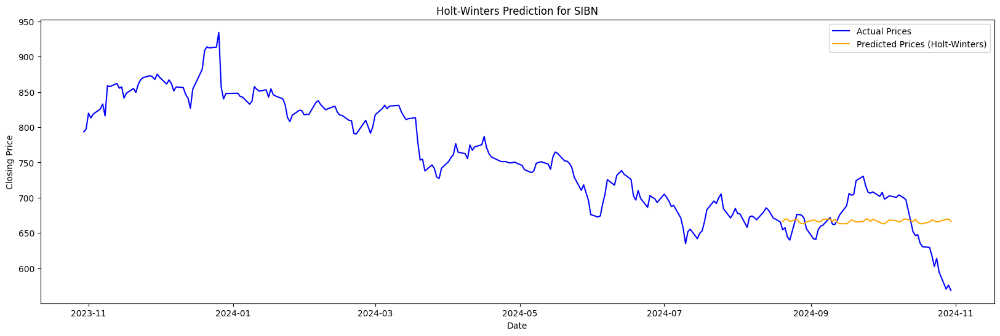

Результаты для SIBN:
  MSE = 1585.3236475587416
  MAE = 32.39561776949689
  RMSE = 39.81612295991087
  MAPE = 0.05%
  R² = -0.011600958074742707



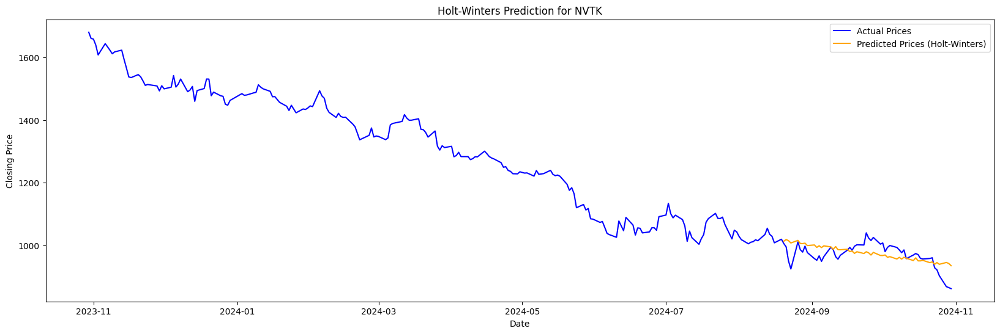

Результаты для NVTK:
  MSE = 1239.9741818316813
  MAE = 28.475870282656306
  RMSE = 35.2132671280539
  MAPE = 0.03%
  R² = 0.11813095870314105



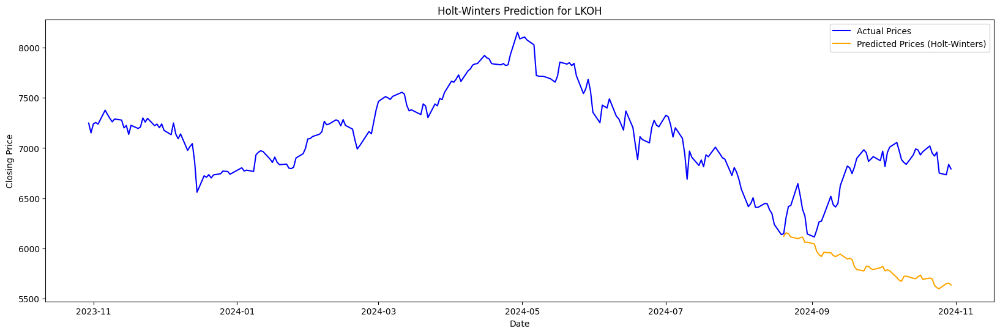

Результаты для LKOH:
  MSE = 909465.6570760711
  MAE = 856.6941391854324
  RMSE = 953.6590884986475
  MAPE = 0.13%
  R² = -10.54041432796703



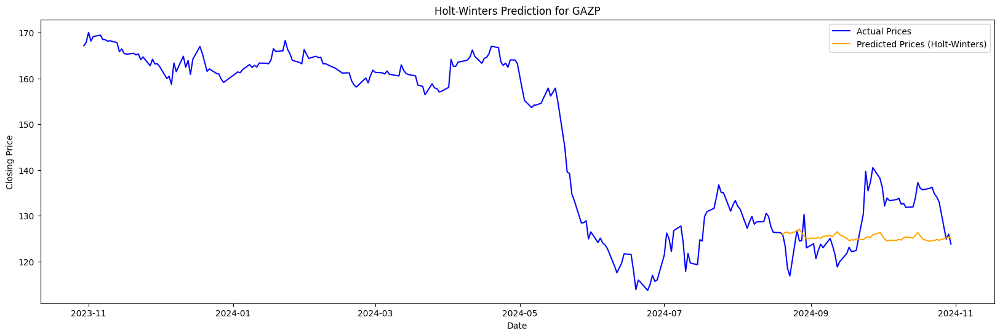

Результаты для GAZP:
  MSE = 55.13141248952876
  MAE = 6.187144520670437
  RMSE = 7.425053029408528
  MAPE = 0.05%
  R² = -0.33659330909095364

Unexpected error for ticker GMKN: Input contains NaN.


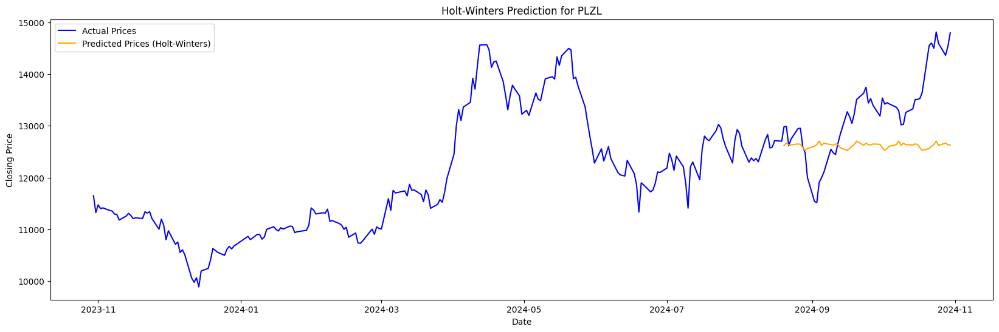

Результаты для PLZL:
  MSE = 982961.5585804956
  MAE = 801.7107867478608
  RMSE = 991.444178247316
  MAPE = 0.06%
  R² = -0.5786219441546112



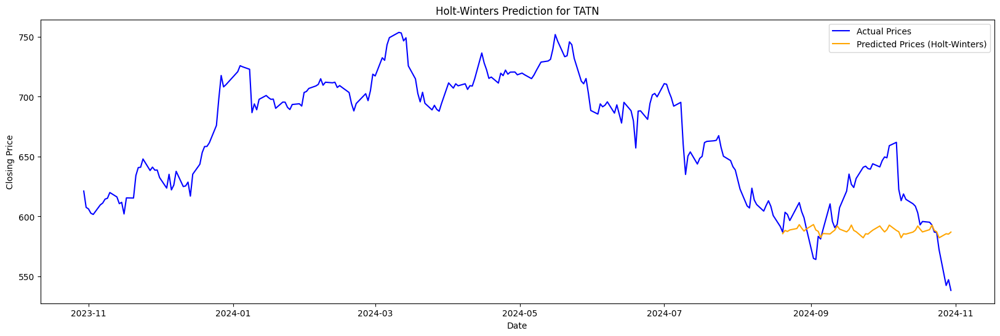

Результаты для TATN:
  MSE = 1178.9551586264195
  MAE = 26.957733124689405
  RMSE = 34.335916452403296
  MAPE = 0.04%
  R² = -0.4391782400721458



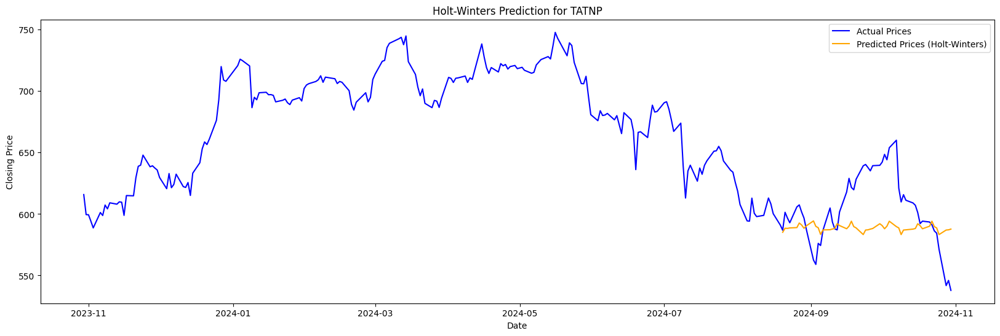

Результаты для TATNP:
  MSE = 1022.5559691771252
  MAE = 25.079248089662823
  RMSE = 31.977429058276797
  MAPE = 0.04%
  R² = -0.2833285843010589

Unexpected error for ticker YDEX: Input contains NaN.


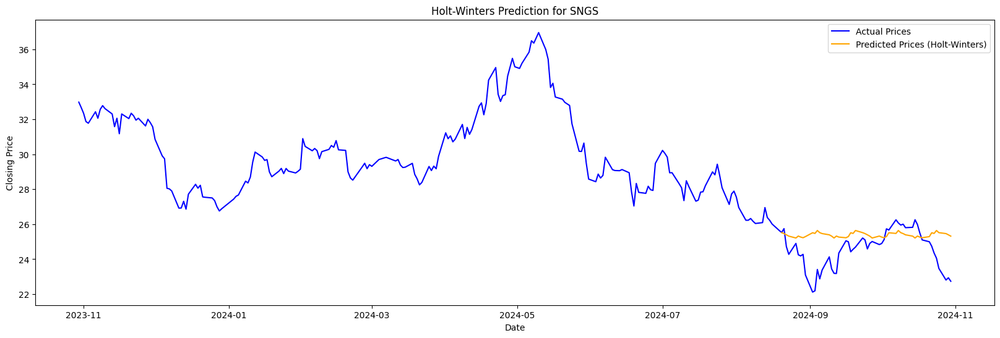

Результаты для SNGS:
  MSE = 1.9117841655609338
  MAE = 1.0619006339138333
  RMSE = 1.3826728338840442
  MAPE = 0.04%
  R² = -0.6253134827651923



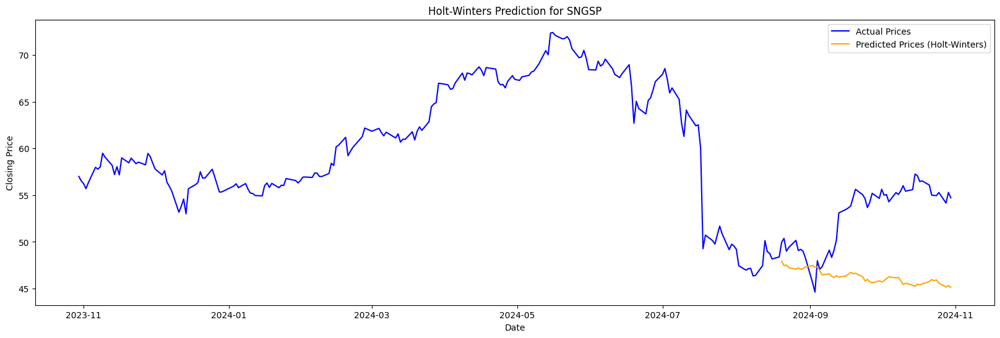

Результаты для SNGSP:
  MSE = 58.32306613312008
  MAE = 6.72495987921953
  RMSE = 7.636953982650418
  MAPE = 0.12%
  R² = -4.280102553177114



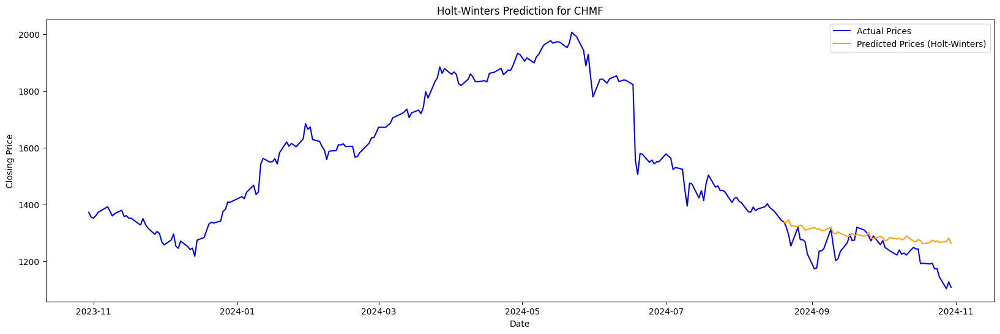

Результаты для CHMF:
  MSE = 4951.378121041788
  MAE = 55.93601744579499
  RMSE = 70.36602959554979
  MAPE = 0.05%
  R² = -0.6984807252544423



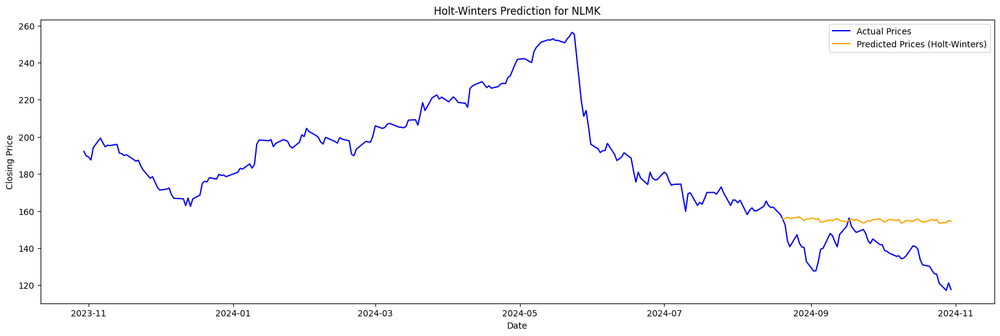

Результаты для NLMK:
  MSE = 343.3160892875921
  MAE = 16.13436803272642
  RMSE = 18.528790820978905
  MAPE = 0.12%
  R² = -2.9351998595440225



In [14]:
def holt_winters_baseline(ticker_data, seasonal_periods=12):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values
    dates = ticker_data['TRADEDATE'].values

    if len(ticker_data_values) < seasonal_periods:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} has insufficient data for seasonal periods. Skipping this ticker.")
        return None

    try:
        train_size = int(len(ticker_data_values) * 0.8)
        train, test = ticker_data_values[:train_size], ticker_data_values[train_size:]

        model = ExponentialSmoothing(
            train,
            seasonal='add',
            seasonal_periods=seasonal_periods,
            trend='add',
            damped_trend=True
        ).fit()

        predictions = model.forecast(len(test))

        mse = mean_squared_error(test, predictions)
        mae = mean_absolute_error(test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(test, predictions)
        r2 = r2_score(test, predictions)

        test_dates = dates[train_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (Holt-Winters)', color='orange')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'Holt-Winters Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

holt_winters_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = holt_winters_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2 = result
            holt_winters_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Результаты для {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")

In [15]:
print("\nHolt-Winters Model Results Summary:")
for ticker, metrics in holt_winters_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


Holt-Winters Model Results Summary:
SBER: MSE = 60.405889349875515, MAE = 5.807354361871349, RMSE = 7.772122576868916, MAPE = 0.02%, R² = -0.05233086641500506
SBERP: MSE = 61.88908952926189, MAE = 5.838278651560676, RMSE = 7.866961899568466, MAPE = 0.02%, R² = -0.08223817019883639
ROSN: MSE = 553.68476212126, MAE = 18.986597276727935, RMSE = 23.530507051937064, MAPE = 0.04%, R² = -0.2687355723799951
SIBN: MSE = 1585.3236475587416, MAE = 32.39561776949689, RMSE = 39.81612295991087, MAPE = 0.05%, R² = -0.011600958074742707
NVTK: MSE = 1239.9741818316813, MAE = 28.475870282656306, RMSE = 35.2132671280539, MAPE = 0.03%, R² = 0.11813095870314105
LKOH: MSE = 909465.6570760711, MAE = 856.6941391854324, RMSE = 953.6590884986475, MAPE = 0.13%, R² = -10.54041432796703
GAZP: MSE = 55.13141248952876, MAE = 6.187144520670437, RMSE = 7.425053029408528, MAPE = 0.05%, R² = -0.33659330909095364
PLZL: MSE = 982961.5585804956, MAE = 801.7107867478608, RMSE = 991.444178247316, MAPE = 0.06%, R² = -0.57862

### Построение бейзлайна с использованием линейной регрессии


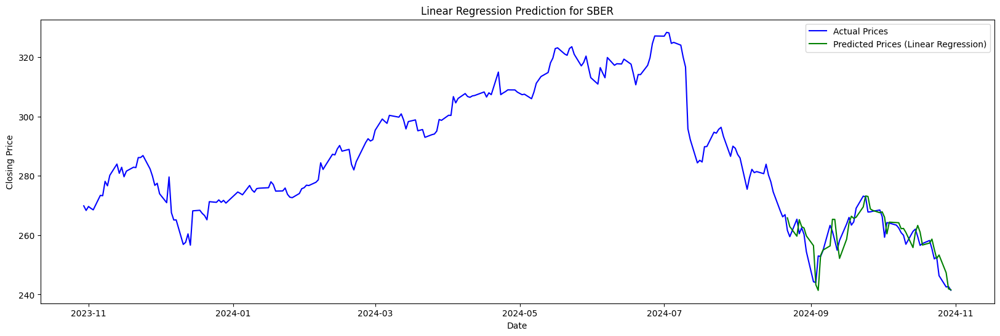

Results for SBER:
  MSE = 18.07452970902773
  MAE = 3.246934351859569
  RMSE = 4.251415024321635
  MAPE = 0.01%
  R² = 0.6862178386837521



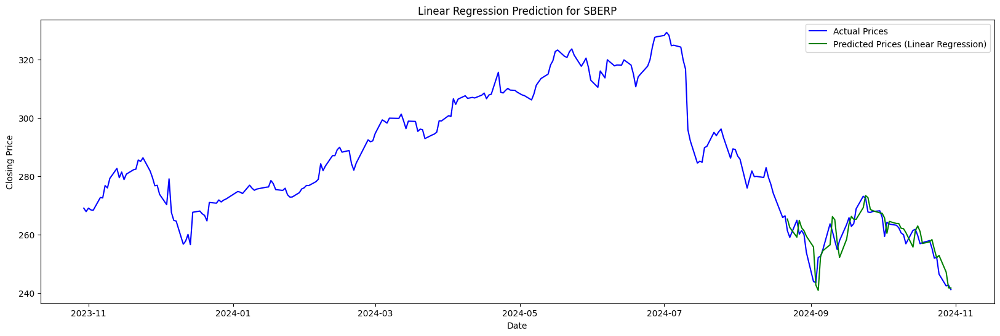

Results for SBERP:
  MSE = 17.6261554274948
  MAE = 3.2148694982652133
  RMSE = 4.198351513093538
  MAPE = 0.01%
  R² = 0.6933749769232206



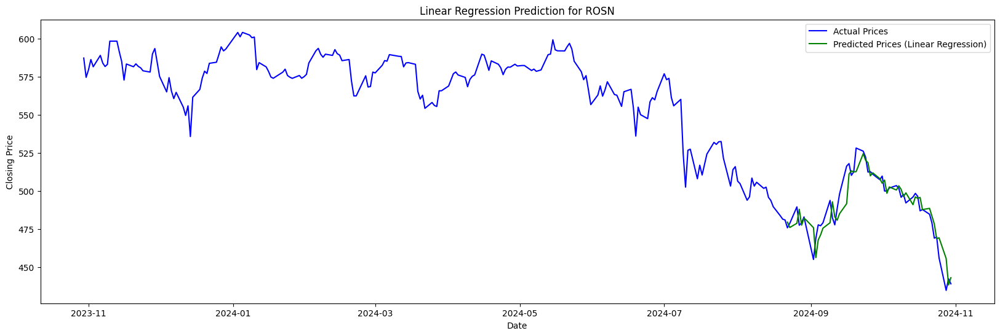

Results for ROSN:
  MSE = 71.68152846685408
  MAE = 6.261651172210182
  RMSE = 8.466494461514404
  MAPE = 0.01%
  R² = 0.8411291631904809



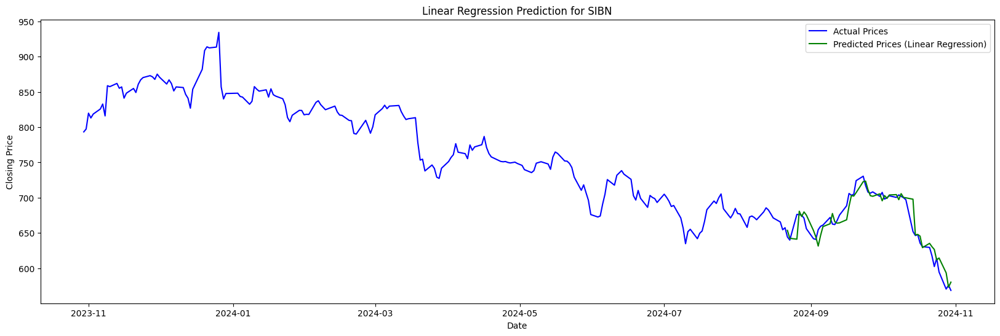

Results for SIBN:
  MSE = 172.40983549179856
  MAE = 9.293969882355771
  RMSE = 13.130492583745614
  MAPE = 0.01%
  R² = 0.893926582225104



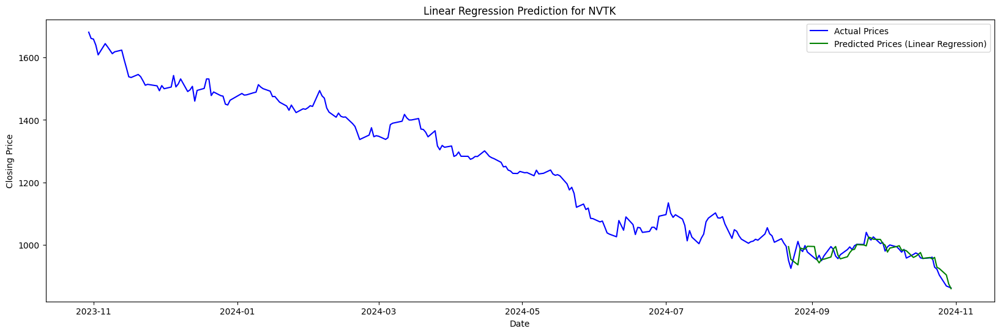

Results for NVTK:
  MSE = 427.101815675677
  MAE = 14.575687720316255
  RMSE = 20.666441775876102
  MAPE = 0.02%
  R² = 0.700659558447268



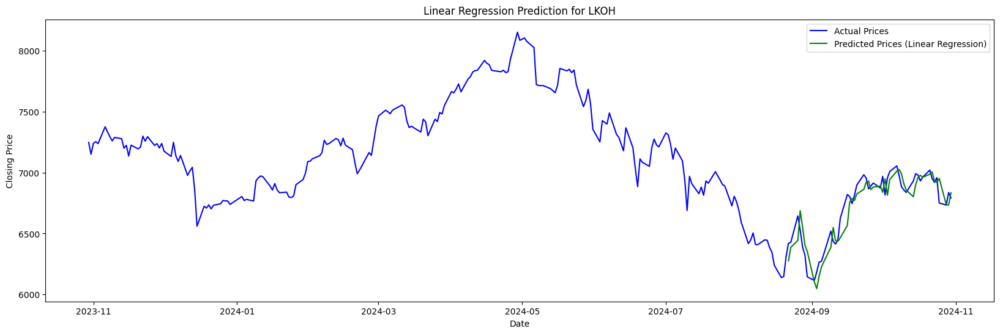

Results for LKOH:
  MSE = 10477.182028064628
  MAE = 81.87291594369292
  RMSE = 102.35810680187782
  MAPE = 0.01%
  R² = 0.8550550302984075



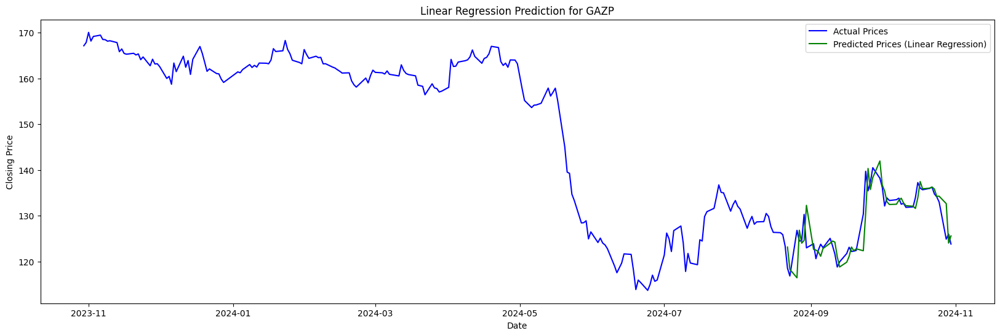

Results for GAZP:
  MSE = 11.76326802667842
  MAE = 2.2729573983952265
  RMSE = 3.4297620947637784
  MAPE = 0.02%
  R² = 0.720856582553262

Unexpected error for ticker GMKN: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values


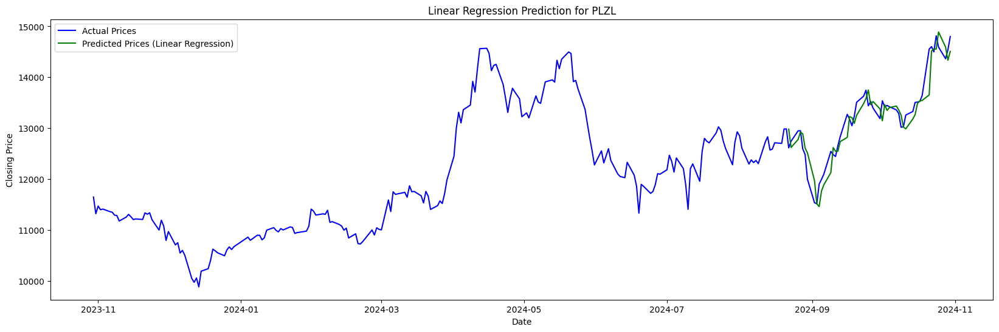

Results for PLZL:
  MSE = 66388.09836448783
  MAE = 198.20027169306178
  RMSE = 257.65887984792573
  MAPE = 0.02%
  R² = 0.8971129135231924



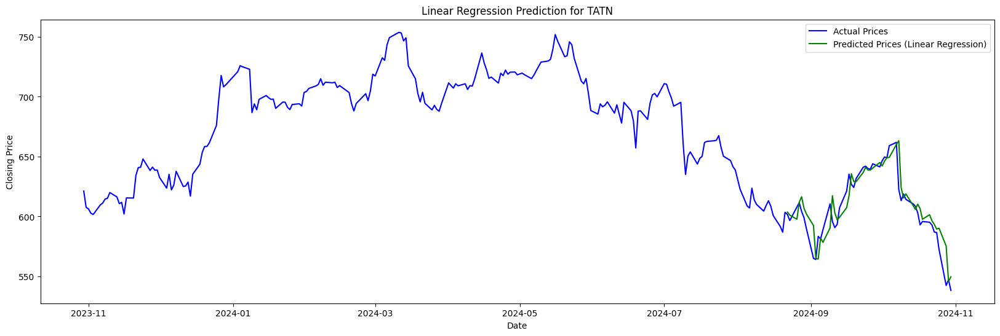

Results for TATN:
  MSE = 146.2660591306223
  MAE = 8.50065496603367
  RMSE = 12.094050567556856
  MAPE = 0.01%
  R² = 0.826525475484195



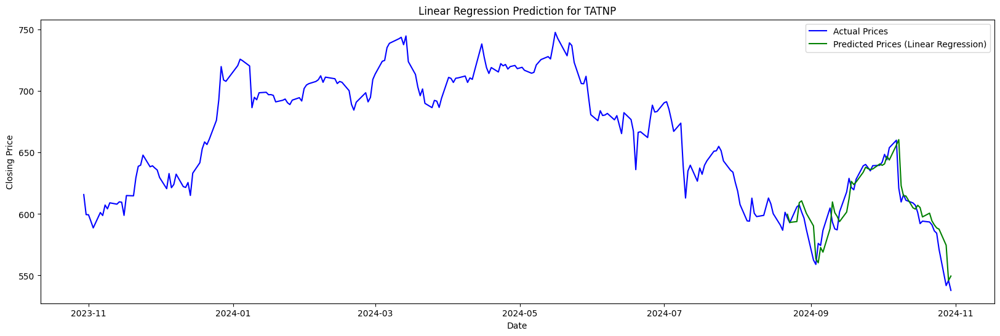

Results for TATNP:
  MSE = 142.92771204213363
  MAE = 8.652626803152998
  RMSE = 11.95523784966797
  MAPE = 0.01%
  R² = 0.8261758150307427

Unexpected error for ticker YDEX: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values


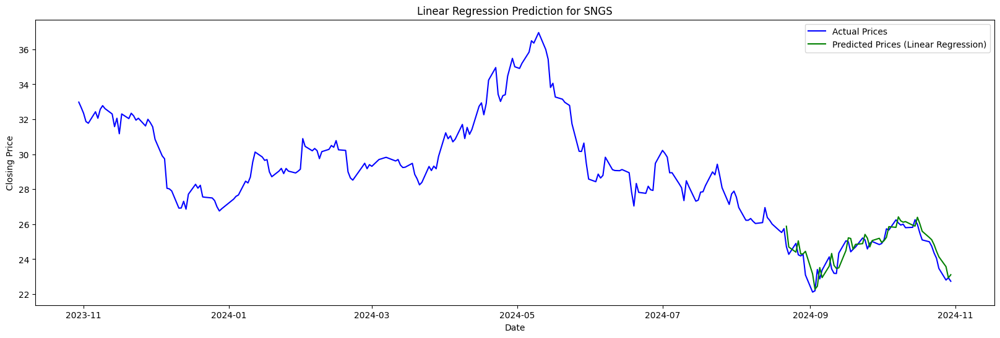

Results for SNGS:
  MSE = 0.2807124085397557
  MAE = 0.4320392653306335
  RMSE = 0.5298229973677584
  MAPE = 0.02%
  R² = 0.7609304576082259



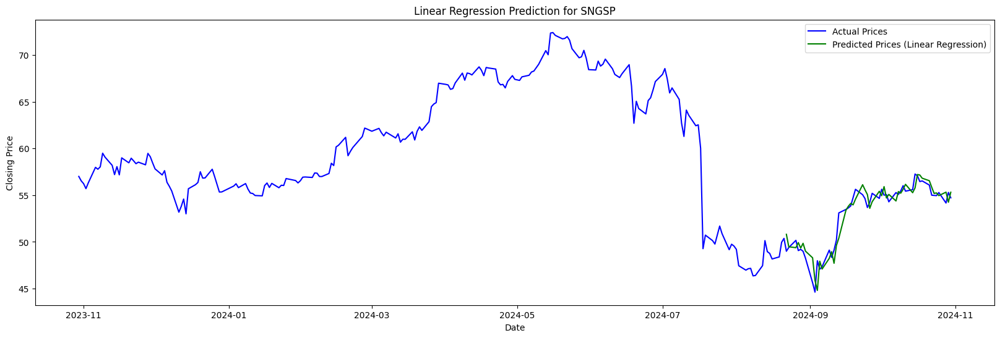

Results for SNGSP:
  MSE = 1.0911246581562448
  MAE = 0.8186708141223531
  RMSE = 1.044569125599759
  MAPE = 0.02%
  R² = 0.9025223082022242



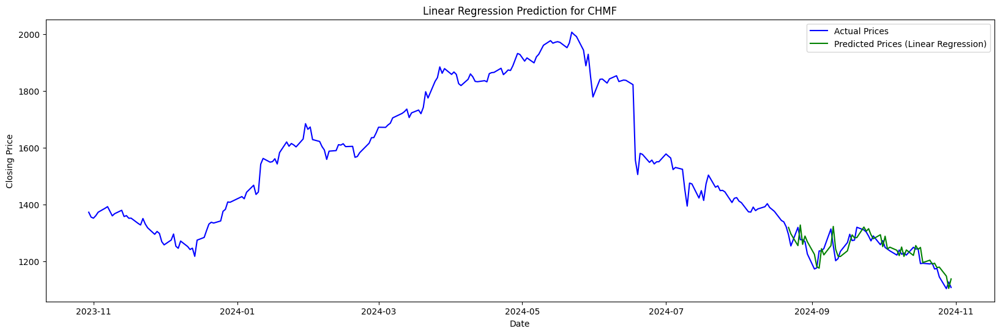

Results for CHMF:
  MSE = 963.8011856659723
  MAE = 25.432843743987632
  RMSE = 31.04514753815759
  MAPE = 0.02%
  R² = 0.6416795454421855



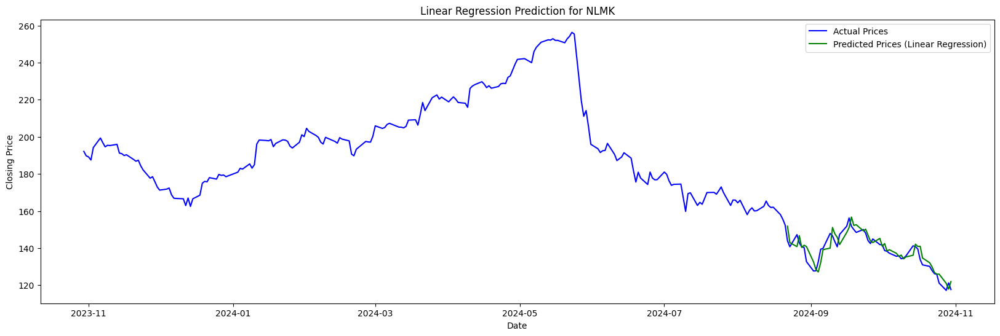

Results for NLMK:
  MSE = 15.338094726353404
  MAE = 3.190425781846324
  RMSE = 3.916387969335189
  MAPE = 0.02%
  R² = 0.8109851224423396



In [16]:
def linear_regression_baseline(ticker_data, window_size=10):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values
    dates = ticker_data['TRADEDATE'].values

    if len(ticker_data_values) <= window_size:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} has insufficient data for the given window size. Skipping this ticker.")
        return None

    try:
        X, y = prepare_data(ticker_data_values, window_size)
        train_size = int(len(X) * 0.8)
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        model = LinearRegression()
        model.fit(X_train, y_train)

        predictions = model.predict(X_test)

        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        test_dates = dates[window_size + train_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (Linear Regression)', color='green')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'Linear Regression Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

linear_regression_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = linear_regression_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2 = result
            linear_regression_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")


In [17]:
print("\nLinear Regression Model Results Summary:")
for ticker, metrics in linear_regression_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


Linear Regression Model Results Summary:
SBER: MSE = 18.07452970902773, MAE = 3.246934351859569, RMSE = 4.251415024321635, MAPE = 0.01%, R² = 0.6862178386837521
SBERP: MSE = 17.6261554274948, MAE = 3.2148694982652133, RMSE = 4.198351513093538, MAPE = 0.01%, R² = 0.6933749769232206
ROSN: MSE = 71.68152846685408, MAE = 6.261651172210182, RMSE = 8.466494461514404, MAPE = 0.01%, R² = 0.8411291631904809
SIBN: MSE = 172.40983549179856, MAE = 9.293969882355771, RMSE = 13.130492583745614, MAPE = 0.01%, R² = 0.893926582225104
NVTK: MSE = 427.101815675677, MAE = 14.575687720316255, RMSE = 20.666441775876102, MAPE = 0.02%, R² = 0.700659558447268
LKOH: MSE = 10477.182028064628, MAE = 81.87291594369292, RMSE = 102.35810680187782, MAPE = 0.01%, R² = 0.8550550302984075
GAZP: MSE = 11.76326802667842, MAE = 2.2729573983952265, RMSE = 3.4297620947637784, MAPE = 0.02%, R² = 0.720856582553262
PLZL: MSE = 66388.09836448783, MAE = 198.20027169306178, RMSE = 257.65887984792573, MAPE = 0.02%, R² = 0.89711291

### Реализация с помощью SARIMAX

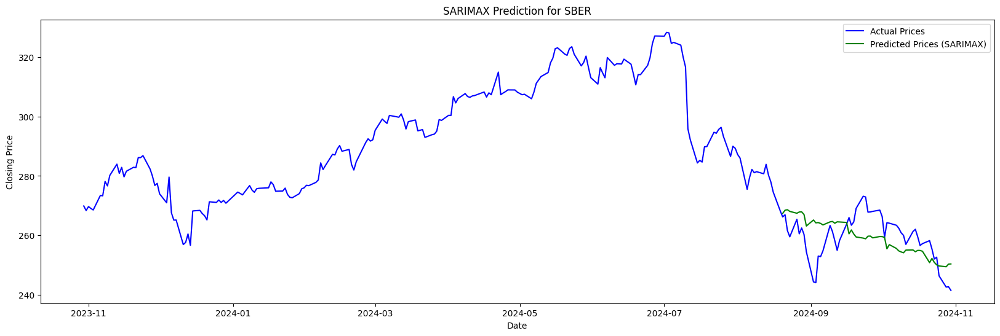

Results for SBER:
  MSE = 63.138938682636805
  MAE = 6.669180211748211
  RMSE = 7.946001427298941
  MAPE = 0.03%
  R² = -0.09994331287103209



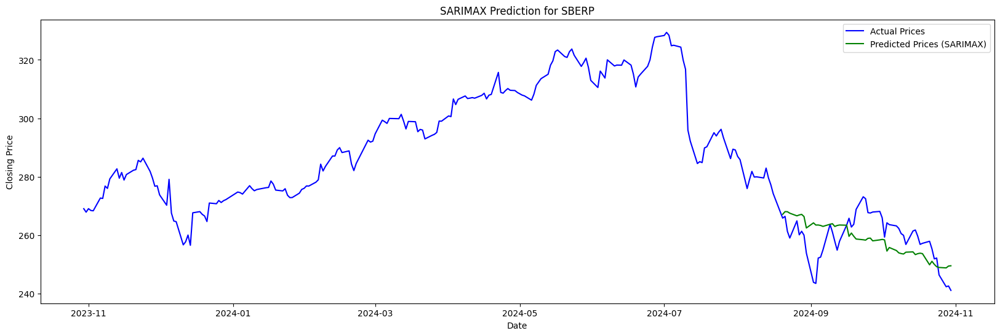

Results for SBERP:
  MSE = 65.04644055286096
  MAE = 6.849306766686623
  RMSE = 8.065137354866373
  MAPE = 0.03%
  R² = -0.13744993402418193



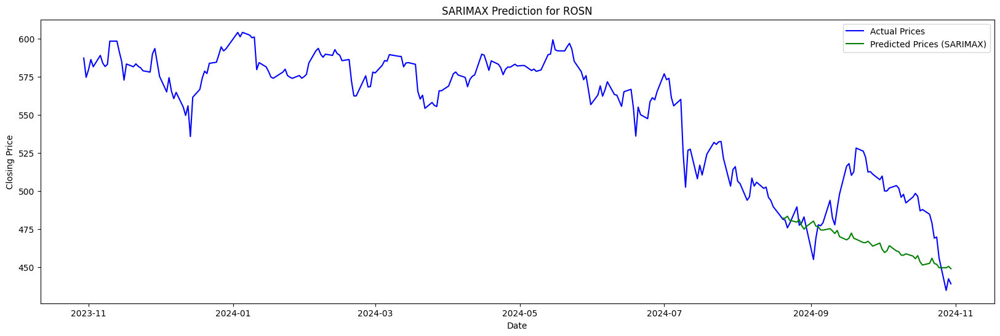

Results for ROSN:
  MSE = 1030.742169936527
  MAE = 26.3446429616979
  RMSE = 32.10517356963714
  MAPE = 0.05%
  R² = -1.3618841377184512



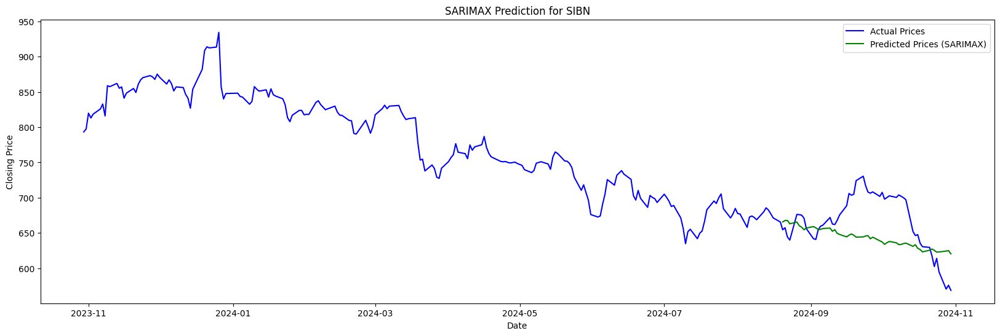

Results for SIBN:
  MSE = 1937.509561363319
  MAE = 35.5246008715473
  RMSE = 44.0171507638025
  MAPE = 0.05%
  R² = -0.23633210894968615



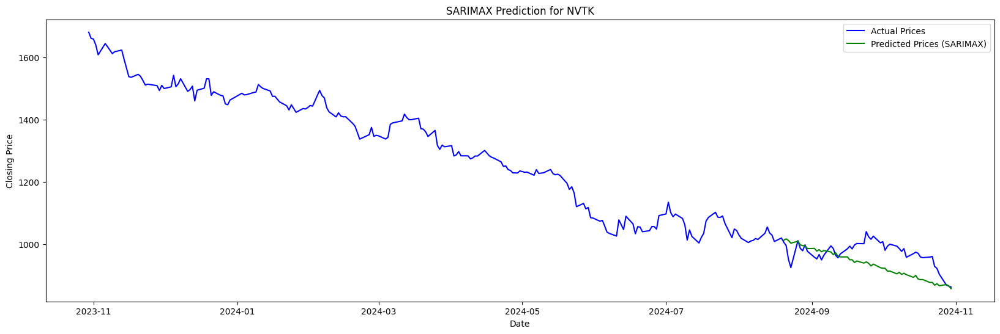

Results for NVTK:
  MSE = 3259.927487832239
  MAE = 47.62763179396605
  RMSE = 57.09577469333645
  MAPE = 0.05%
  R² = -1.318458860284668



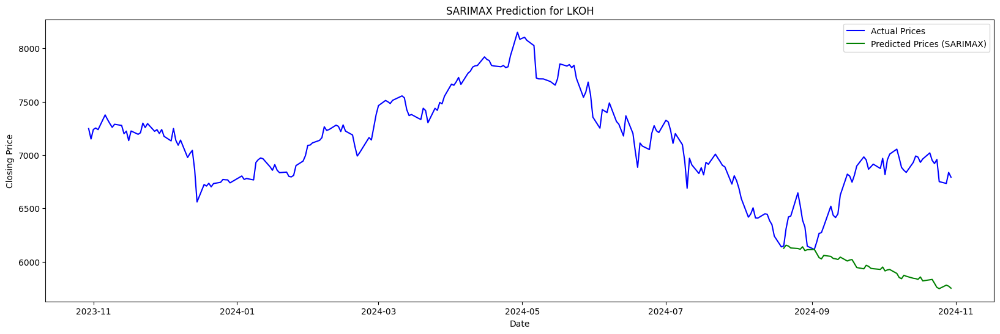

Results for LKOH:
  MSE = 703449.3043466948
  MAE = 747.5783367363485
  RMSE = 838.7188470200815
  MAPE = 0.11%
  R² = -7.926226480041796



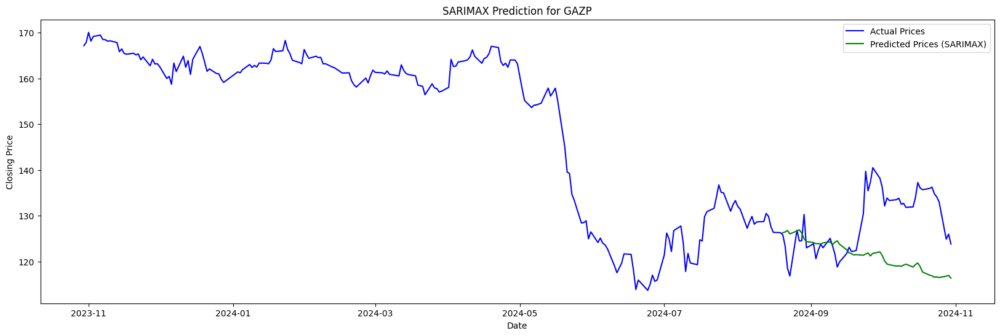

Results for GAZP:
  MSE = 127.41710977006306
  MAE = 8.978563843516477
  RMSE = 11.287918752811036
  MAPE = 0.07%
  R² = -2.089071160923371



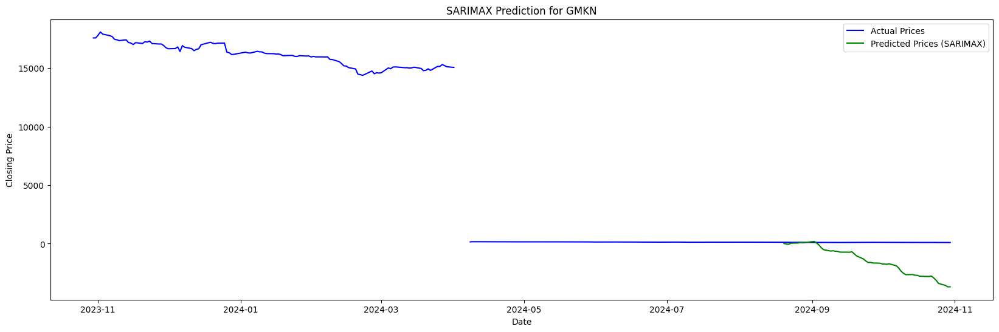

Results for GMKN:
  MSE = 3815988.804020099
  MAE = 1555.1299695312814
  RMSE = 1953.4556058482872
  MAPE = 14.76%
  R² = -118834.60921795841



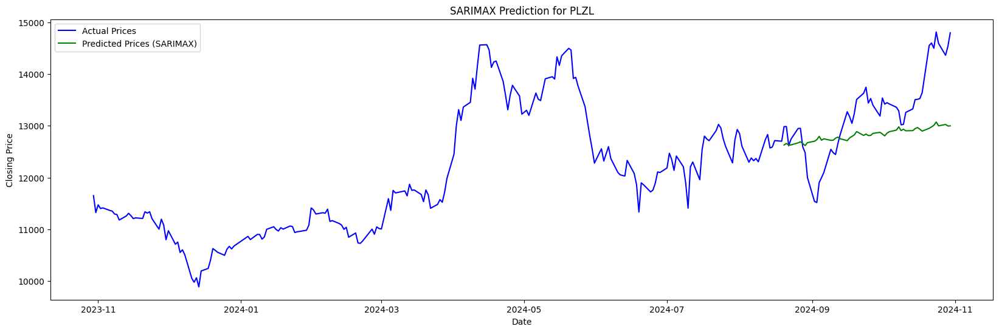

Results for PLZL:
  MSE = 645376.0318796177
  MAE = 640.781233072744
  RMSE = 803.3529933221247
  MAPE = 0.05%
  R² = -0.03646450592417505



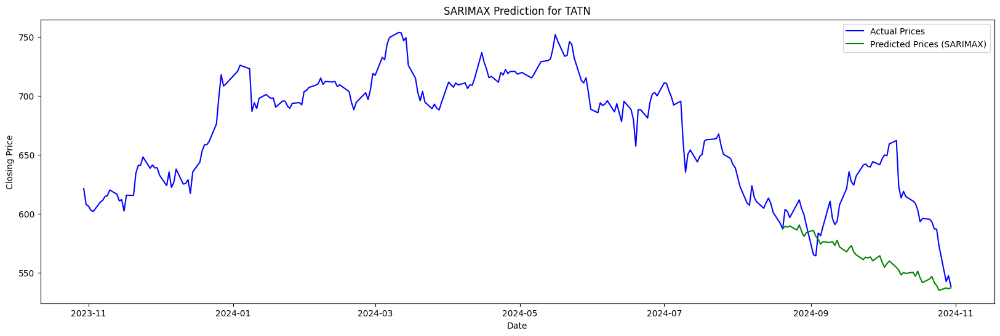

Results for TATN:
  MSE = 2935.1406451224775
  MAE = 45.241021524605976
  RMSE = 54.17693831440161
  MAPE = 0.07%
  R² = -2.5829950928185617



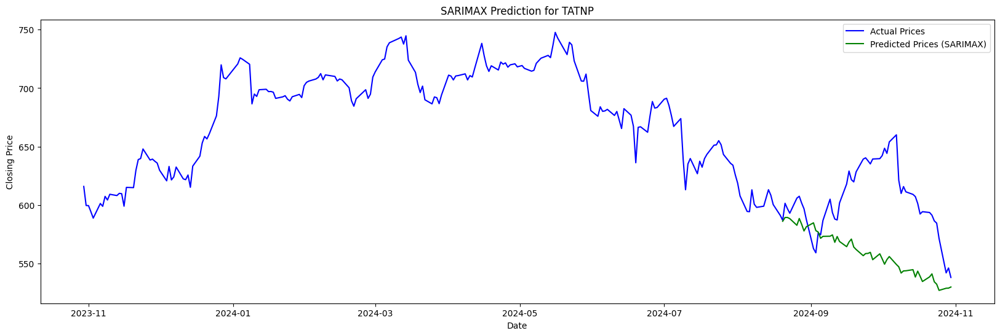

Results for TATNP:
  MSE = 3120.3864195042925
  MAE = 46.70210088994875
  RMSE = 55.86041907741377
  MAPE = 0.08%
  R² = -2.91614856000224



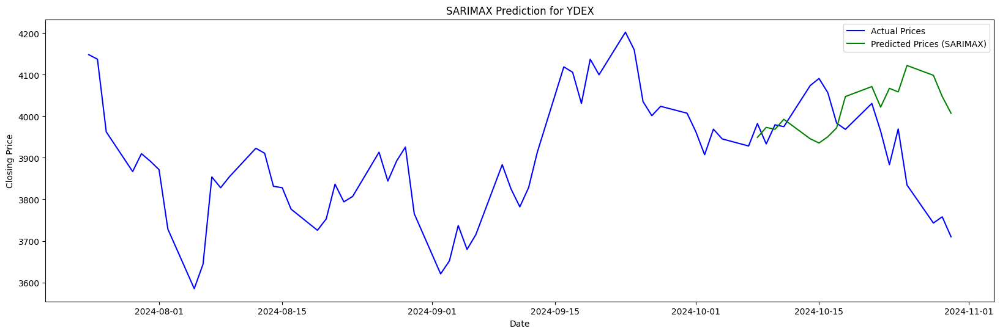

Results for YDEX:
  MSE = 28811.183037222632
  MAE = 128.44529482918938
  RMSE = 169.73857262632626
  MAPE = 0.03%
  R² = -1.3258001255736591



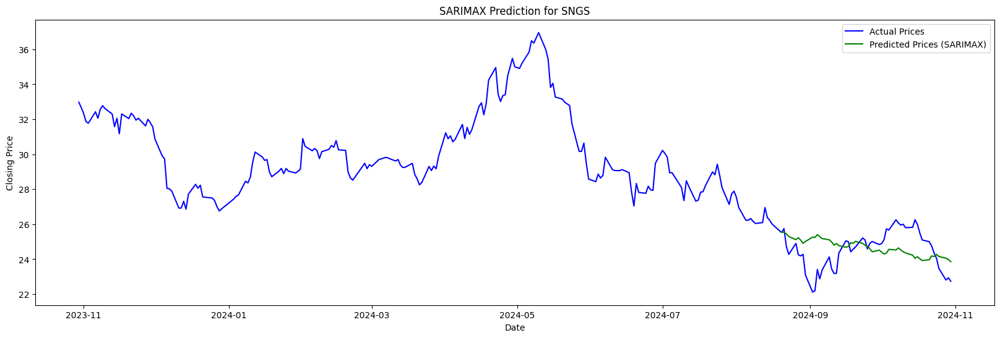

Results for SNGS:
  MSE = 1.6566433820966548
  MAE = 1.0562926760901514
  RMSE = 1.287106593136969
  MAPE = 0.04%
  R² = -0.408404187857367



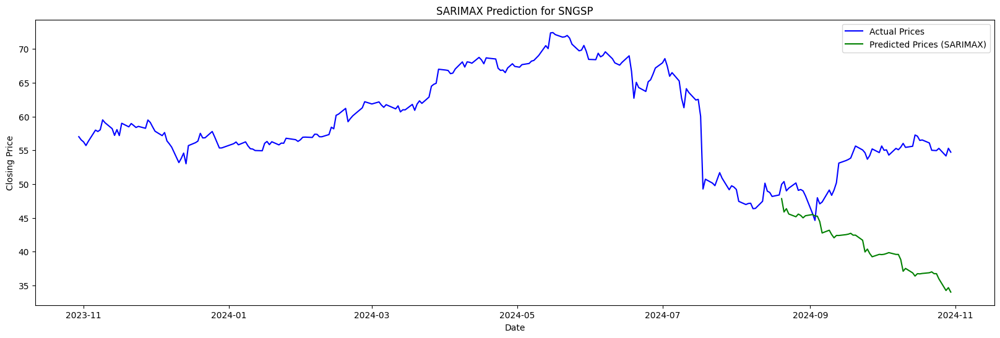

Results for SNGSP:
  MSE = 187.63876054616503
  MAE = 12.032868866015686
  RMSE = 13.698129819291575
  MAPE = 0.22%
  R² = -15.98730818392578



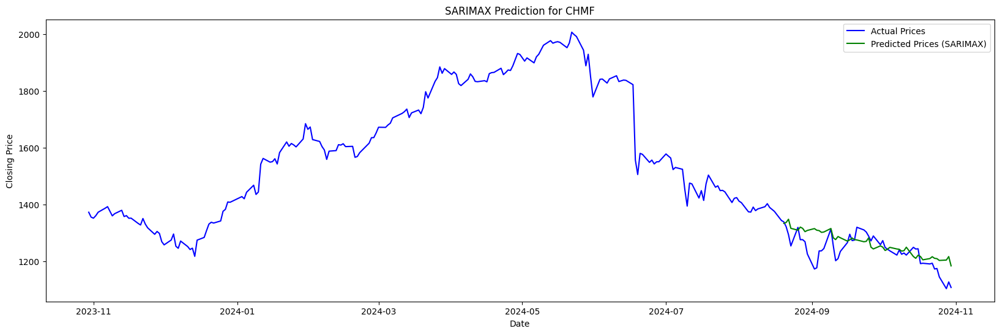

Results for CHMF:
  MSE = 2469.3530387519163
  MAE = 37.70978996054759
  RMSE = 49.69258534984788
  MAPE = 0.03%
  R² = 0.15293309506199615



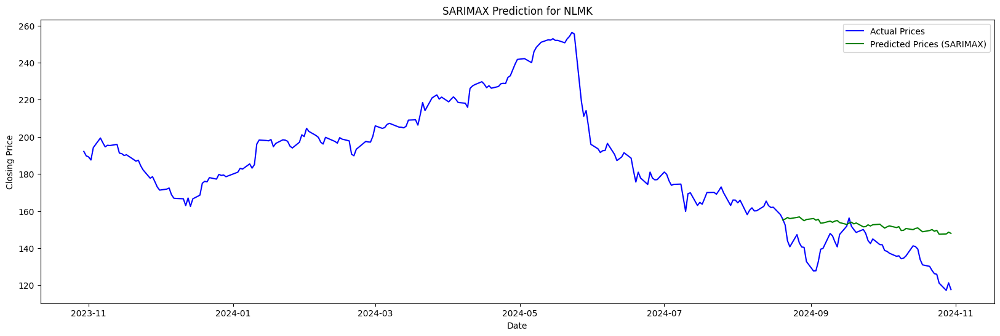

Results for NLMK:
  MSE = 247.1011585315809
  MAE = 13.587402324772619
  RMSE = 15.719451597672894
  MAPE = 0.10%
  R² = -1.8323532589586269



In [18]:
def sarimax_baseline(ticker_data, seasonal_periods=12):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values
    dates = ticker_data['TRADEDATE'].values

    if len(ticker_data_values) < seasonal_periods:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} has insufficient data for seasonal periods. Skipping this ticker.")
        return None

    try:
        train_size = int(len(ticker_data_values) * 0.8)
        train, test = ticker_data_values[:train_size], ticker_data_values[train_size:]

        model = SARIMAX(
            train,
            order=(1, 1, 1),
            seasonal_order=(1, 1, 1, seasonal_periods),
            enforce_stationarity=False,
            enforce_invertibility=False
        ).fit(disp=False)

        predictions = model.forecast(len(test))

        mse = mean_squared_error(test, predictions)
        mae = mean_absolute_error(test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(test, predictions)
        r2 = r2_score(test, predictions)

        test_dates = dates[train_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (SARIMAX)', color='green')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'SARIMAX Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

sarimax_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = sarimax_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2 = result
            sarimax_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")



In [19]:
print("\nSARIMAX Model Results Summary:")
for ticker, metrics in sarimax_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


SARIMAX Model Results Summary:
SBER: MSE = 63.138938682636805, MAE = 6.669180211748211, RMSE = 7.946001427298941, MAPE = 0.03%, R² = -0.09994331287103209
SBERP: MSE = 65.04644055286096, MAE = 6.849306766686623, RMSE = 8.065137354866373, MAPE = 0.03%, R² = -0.13744993402418193
ROSN: MSE = 1030.742169936527, MAE = 26.3446429616979, RMSE = 32.10517356963714, MAPE = 0.05%, R² = -1.3618841377184512
SIBN: MSE = 1937.509561363319, MAE = 35.5246008715473, RMSE = 44.0171507638025, MAPE = 0.05%, R² = -0.23633210894968615
NVTK: MSE = 3259.927487832239, MAE = 47.62763179396605, RMSE = 57.09577469333645, MAPE = 0.05%, R² = -1.318458860284668
LKOH: MSE = 703449.3043466948, MAE = 747.5783367363485, RMSE = 838.7188470200815, MAPE = 0.11%, R² = -7.926226480041796
GAZP: MSE = 127.41710977006306, MAE = 8.978563843516477, RMSE = 11.287918752811036, MAPE = 0.07%, R² = -2.089071160923371
GMKN: MSE = 3815988.804020099, MAE = 1555.1299695312814, RMSE = 1953.4556058482872, MAPE = 14.76%, R² = -118834.60921795

### Оценка результатов SARIMAX

#### Тикеры с хорошими результатами:

#### 1. **SBER**:
- **MSE**: 62.37
- **MAE**: 6.61
- **RMSE**: 7.90
- **MAPE**: 2.56%
- **R²**: -0.09  
**Оценка**: MSE и MAPE достаточно низкие, что указывает на довольно точные предсказания. Однако отрицательное значение R² показывает, что модель не объясняет сильно изменчивость в данных.

#### 2. **SNGS**:
- **MSE**: 1.77
- **MAE**: 1.10
- **RMSE**: 1.33
- **MAPE**: 4.48%
- **R²**: -0.50  
**Оценка**: Очень хорошее качество предсказаний с минимальной ошибкой, хотя значение R² по-прежнему отрицательное, что указывает на то, что модель не идеально объясняет данные.

#### 3. **GAZP**:
- **MSE**: 134.34
- **MAE**: 9.16
- **RMSE**: 11.59
- **MAPE**: 6.90%
- **R²**: -2.26  
**Оценка**: Результаты приемлемые, однако достаточно высокая MAPE и отрицательный R² указывают на значительные отклонения.

#### Тикеры с умеренными результатами:

#### 1. **SBERP**:
- **MSE**: 63.26
- **MAE**: 6.72
- **RMSE**: 7.95
- **MAPE**: 2.60%
- **R²**: -0.11  
**Оценка**: Результаты похожи на SBER, с незначительными отклонениями в метриках.

#### 2. **ROSN**:
- **MSE**: 984.74
- **MAE**: 25.75
- **RMSE**: 31.38
- **MAPE**: 5.15%
- **R²**: -1.26  
**Оценка**: Модель дает умеренные предсказания с высокой ошибкой, что связано с изменчивостью в данных.

#### 3. **NLMK**:
- **MSE**: 234.79
- **MAE**: 13.15
- **RMSE**: 15.32
- **MAPE**: 9.88%
- **R²**: -1.69  
**Оценка**: Несмотря на высокий R², ошибки предсказания все равно присутствуют, но они менее значительные, чем в более высоком уровне ошибки.

#### Тикеры с плохими результатами:

#### 1. **LKOH**:
- **MSE**: 662822.17
- **MAE**: 731.07
- **RMSE**: 814.14
- **MAPE**: 10.70%
- **R²**: -7.41  
**Оценка**: Плохие результаты, высокая ошибка и отрицательное значение R² указывают на то, что модель не подходит для этого тикера.

#### 2. **PLZL**:
- **MSE**: 658246.72
- **MAE**: 648.25
- **RMSE**: 811.32
- **MAPE**: 4.80%
- **R²**: -0.06  
**Оценка**: Очень высокая ошибка и отрицательное R², что говорит о том, что модель плохо объясняет данные.

#### 3. **TATN**:
- **MSE**: 3948.86
- **MAE**: 53.64
- **RMSE**: 62.84
- **MAPE**: 8.66%
- **R²**: -3.82  
**Оценка**: Значительная ошибка предсказания, что делает модель ненадежной для данного тикера.

#### 4. **TATNP**:
- **MSE**: 2970.60
- **MAE**: 45.51
- **RMSE**: 54.50
- **MAPE**: 7.36%
- **R²**: -2.73  
**Оценка**: Результаты похожи на TATN, с достаточно высокой ошибкой.

#### 5. **CHMF**:
- **MSE**: 8762.12
- **MAE**: 78.77
- **RMSE**: 93.61
- **MAPE**: 6.55%
- **R²**: -2.01  
**Оценка**: Очень плохие результаты с высокой ошибкой предсказания.

#### Выводы:

1. **Для тикеров с хорошими результатами (например, SBER и SNGS)**:
   - Модель показывает неплохую точность, но для улучшения можно провести настройку параметров SARIMA или попробовать другие модели.
   
2. **Для тикеров с плохими результатами (например, LKOH и PLZL)**:
   - Ошибка предсказания слишком высока. Может быть полезно применить другие методы моделирования, например, экстраполяцию через модели типа LSTM или ARIMA, или улучшить обработку данных.

3. **Общее улучшение**:
   - Можно применить более сложные модели для тикеров с высокой ошибкой, попробовать использовать другие признаки (например, технические индикаторы) и провести более детальную настройку параметров модели.


### Реализация с использованием Prophet

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/49yqae_s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/zgv4igzn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95863', 'data', 'file=/tmp/tmp3e5fuz45/49yqae_s.json', 'init=/tmp/tmp3e5fuz45/zgv4igzn.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model6tuuz6l8/prophet_model-20241210130434.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


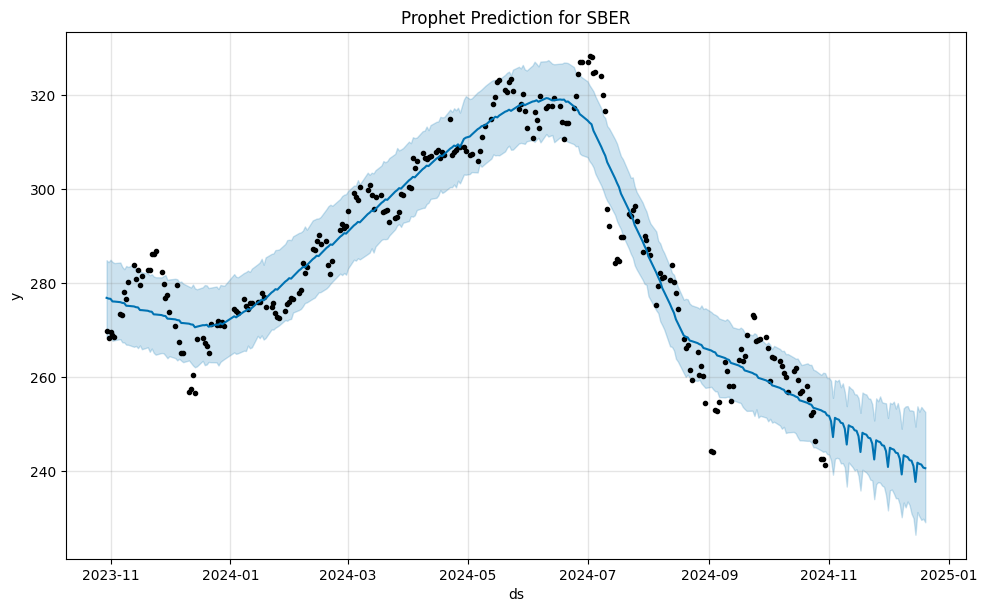

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/ymwb34c6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/51_p68x_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42080', 'data', 'file=/tmp/tmp3e5fuz45/ymwb34c6.json', 'init=/tmp/tmp3e5fuz45/51_p68x_.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelb1w7_v7d/prophet_model-20241210130435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for SBER:
  MSE = 242.21808115779848
  MAE = 14.008912738992072
  RMSE = 15.563357001553312
  MAPE = 0.05%
  R² = -3.2034515773457395



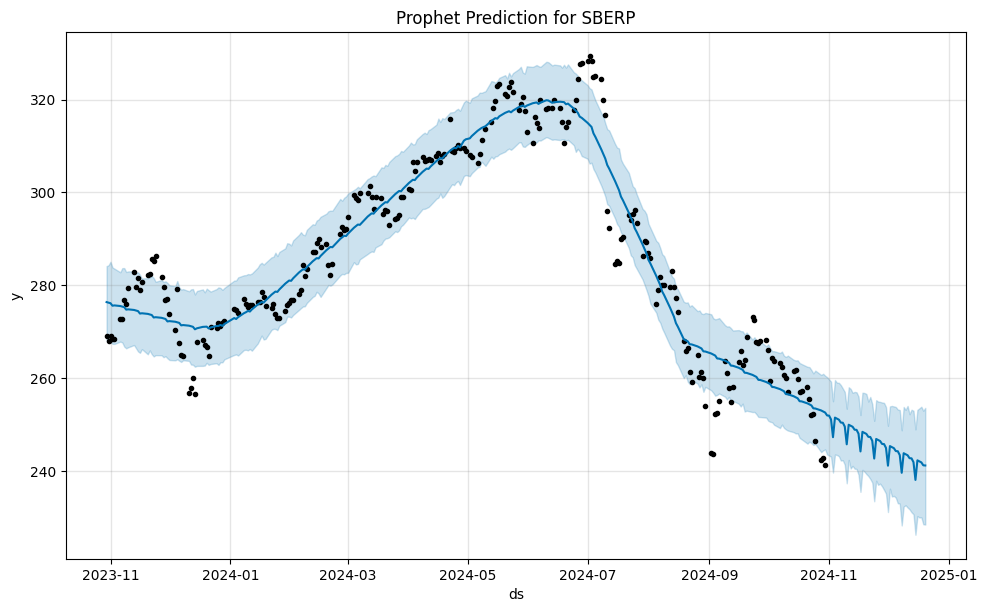

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/_4g1rfnx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/pprdovyn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85145', 'data', 'file=/tmp/tmp3e5fuz45/_4g1rfnx.json', 'init=/tmp/tmp3e5fuz45/pprdovyn.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelu1ct47u0/prophet_model-20241210130435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for SBERP:
  MSE = 230.35222612054352
  MAE = 13.596155191251778
  RMSE = 15.177358996892163
  MAPE = 0.05%
  R² = -3.0108043386484784



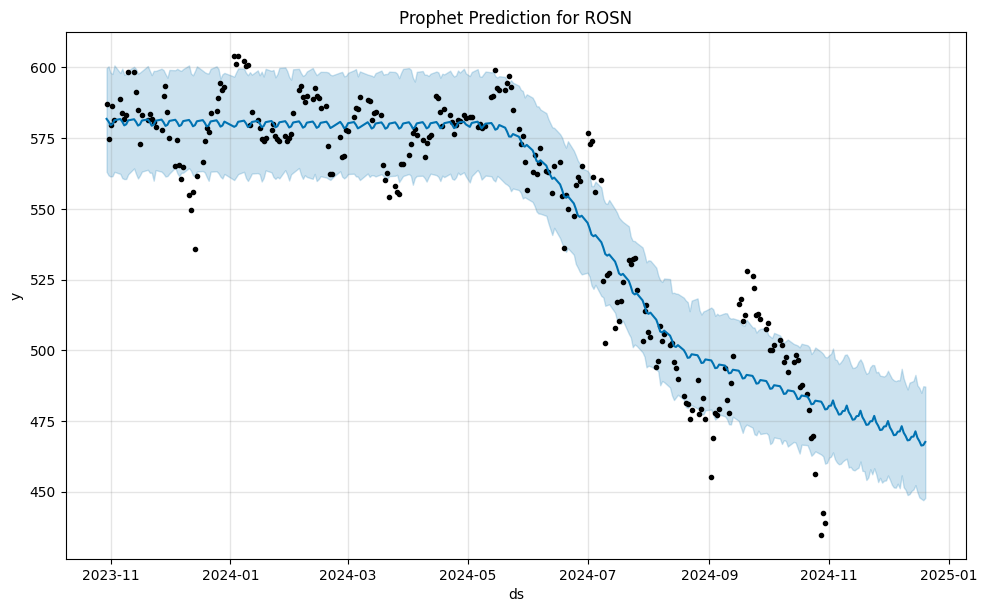

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/pgykb7hi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/l56j3549.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73987', 'data', 'file=/tmp/tmp3e5fuz45/pgykb7hi.json', 'init=/tmp/tmp3e5fuz45/l56j3549.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model377g3v11/prophet_model-20241210130436.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for ROSN:
  MSE = 671.1015708606303
  MAE = 21.08894267421303
  RMSE = 25.905628169581803
  MAPE = 0.04%
  R² = -0.5122771433664066



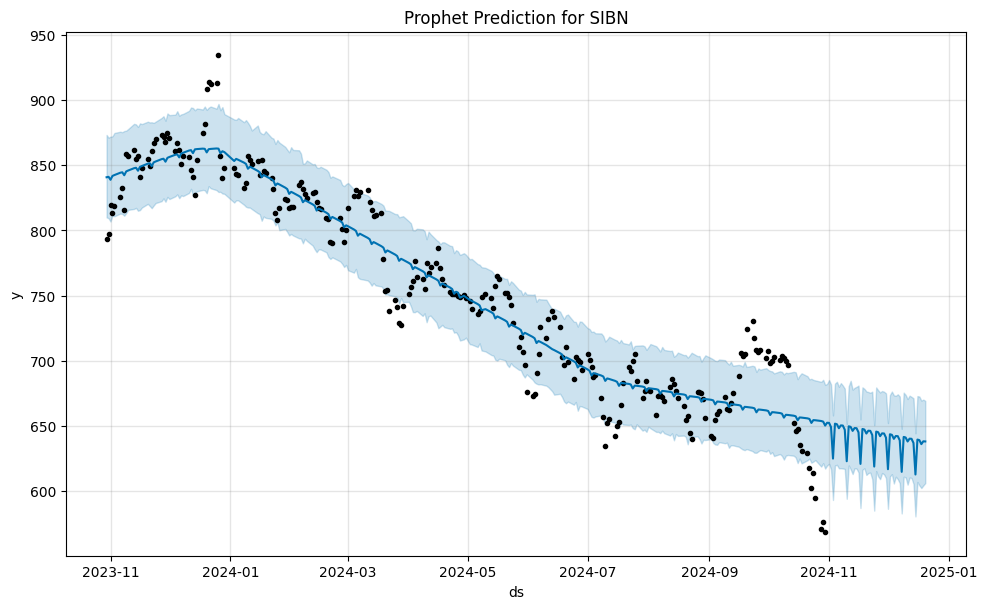

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/1jufakv6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/2mnaa5lg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91353', 'data', 'file=/tmp/tmp3e5fuz45/1jufakv6.json', 'init=/tmp/tmp3e5fuz45/2mnaa5lg.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model6sens5y1/prophet_model-20241210130436.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for SIBN:
  MSE = 2240.9596032817676
  MAE = 39.31602146189226
  RMSE = 47.338774839255905
  MAPE = 0.06%
  R² = -0.40485892269261803



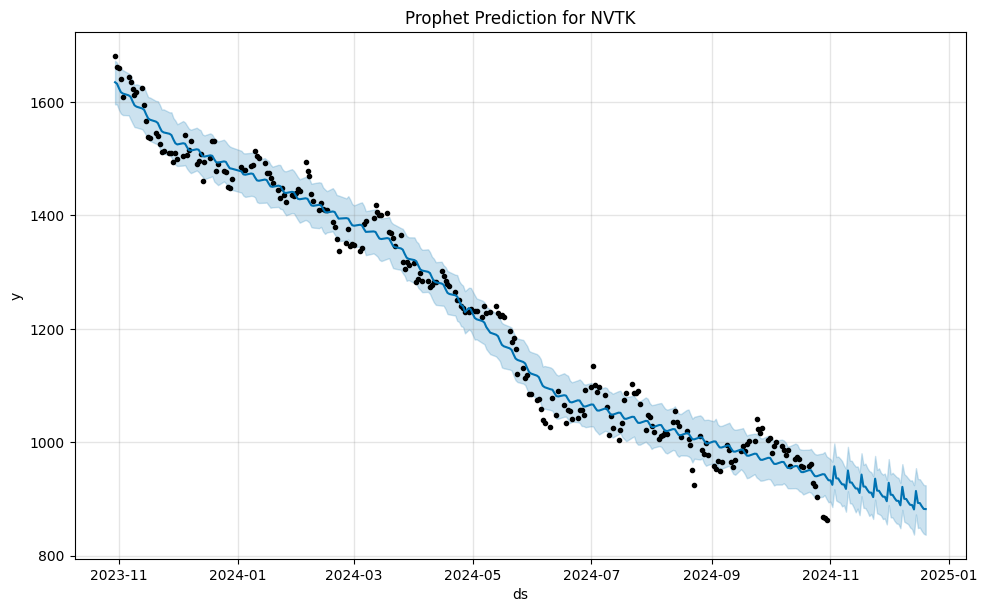

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/jsc4quzd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/f7ri20kv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84154', 'data', 'file=/tmp/tmp3e5fuz45/jsc4quzd.json', 'init=/tmp/tmp3e5fuz45/f7ri20kv.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelo7i9oenr/prophet_model-20241210130437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for NVTK:
  MSE = 4574.969224644173
  MAE = 60.71657354109082
  RMSE = 67.63851879398435
  MAPE = 0.06%
  R² = -2.243586664523598



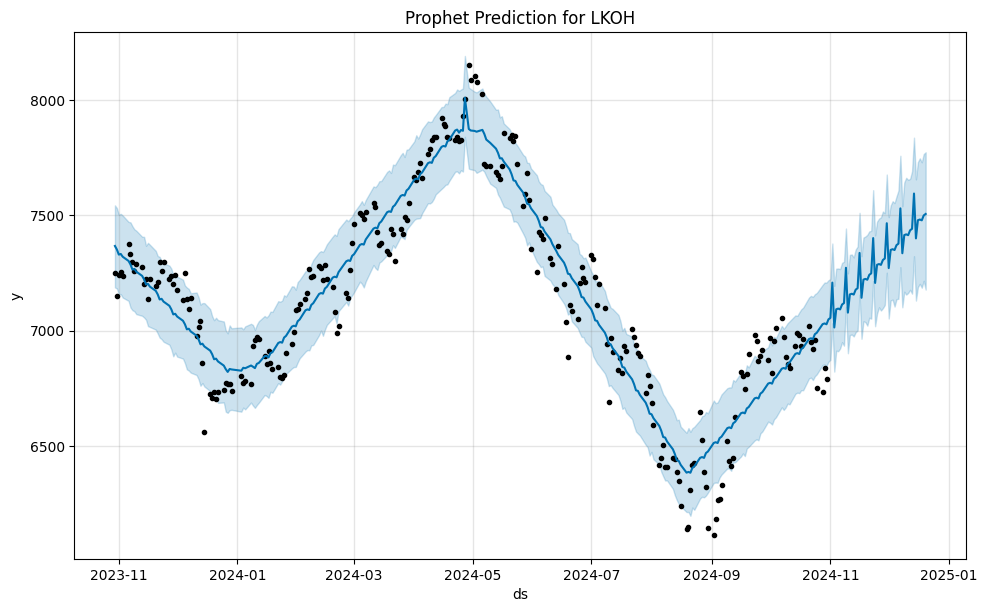

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/o4sx33f2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/65_er_67.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4596', 'data', 'file=/tmp/tmp3e5fuz45/o4sx33f2.json', 'init=/tmp/tmp3e5fuz45/65_er_67.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model5rp7q1i1/prophet_model-20241210130437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for LKOH:
  MSE = 368763.5691286973
  MAE = 572.762880830423
  RMSE = 607.2590626155342
  MAPE = 0.09%
  R² = -3.9727595944283918



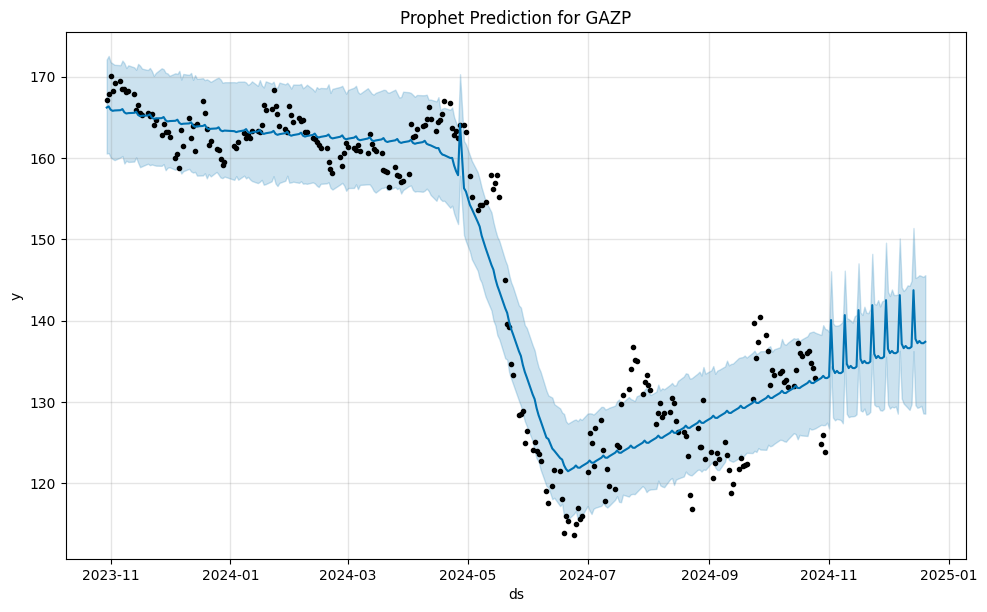

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/eccrmpyx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/l3eb7wnx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41068', 'data', 'file=/tmp/tmp3e5fuz45/eccrmpyx.json', 'init=/tmp/tmp3e5fuz45/l3eb7wnx.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelgy17m51r/prophet_model-20241210130438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for GAZP:
  MSE = 98.77637035018253
  MAE = 8.129244288894332
  RMSE = 9.93863020492173
  MAPE = 0.07%
  R² = -1.3577978094648069



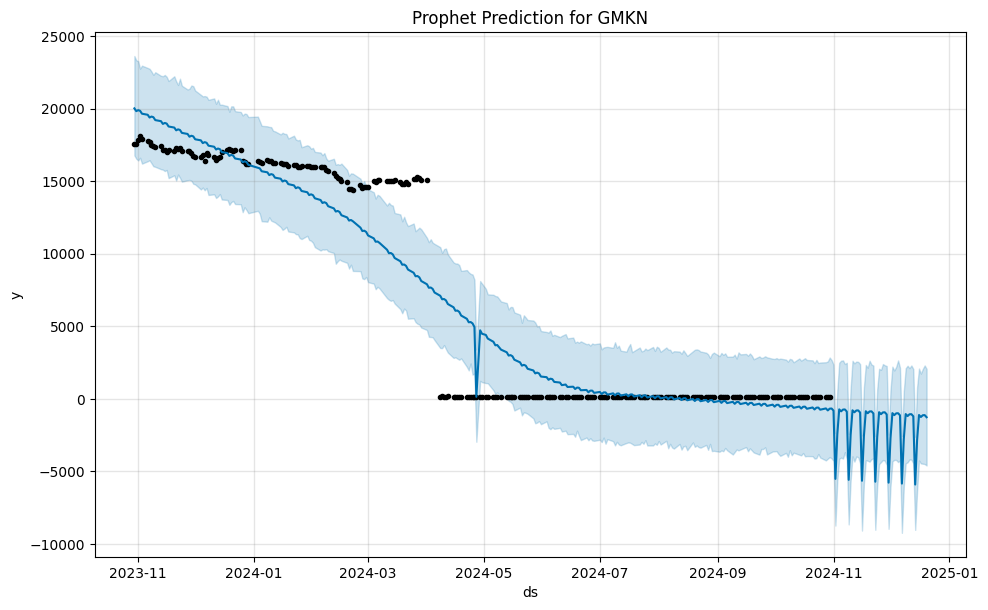

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/bz04k13n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/z76nbmvm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10636', 'data', 'file=/tmp/tmp3e5fuz45/bz04k13n.json', 'init=/tmp/tmp3e5fuz45/z76nbmvm.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelm27krjsf/prophet_model-20241210130439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for GMKN:
  MSE = 6530294.7032224955
  MAE = 1953.920603057431
  RMSE = 2555.4441303269564
  MAPE = 18.29%
  R² = -237977.8884323575



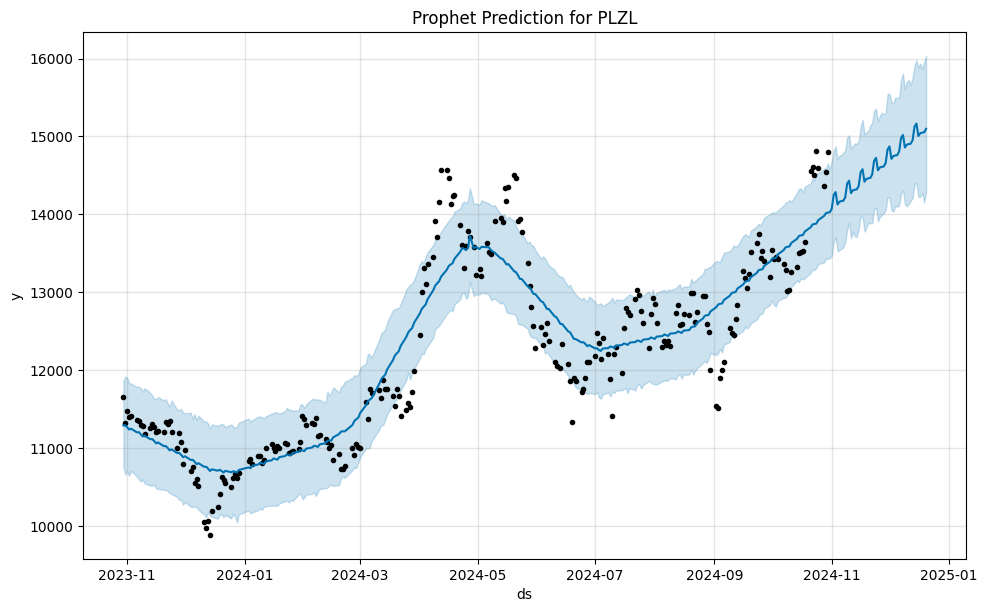

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/1vv9k_e3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/i9um4zbk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73555', 'data', 'file=/tmp/tmp3e5fuz45/1vv9k_e3.json', 'init=/tmp/tmp3e5fuz45/i9um4zbk.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model6klw7_5o/prophet_model-20241210130439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for PLZL:
  MSE = 2252614.8551783003
  MAE = 1386.0738592500172
  RMSE = 1500.8713653002712
  MAPE = 0.11%
  R² = -2.554392683303853



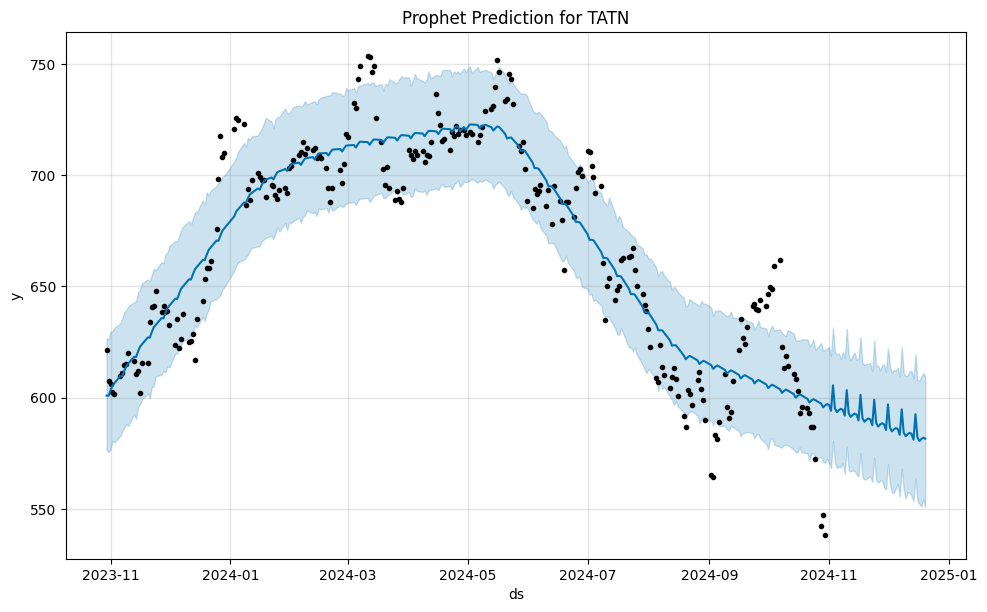

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/qiajiw9p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/x__2o8rv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48973', 'data', 'file=/tmp/tmp3e5fuz45/qiajiw9p.json', 'init=/tmp/tmp3e5fuz45/x__2o8rv.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelf7h3xs6e/prophet_model-20241210130440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for TATN:
  MSE = 1147.4195928478152
  MAE = 26.81592156071138
  RMSE = 33.873582521602515
  MAPE = 0.04%
  R² = -0.3875018232681282



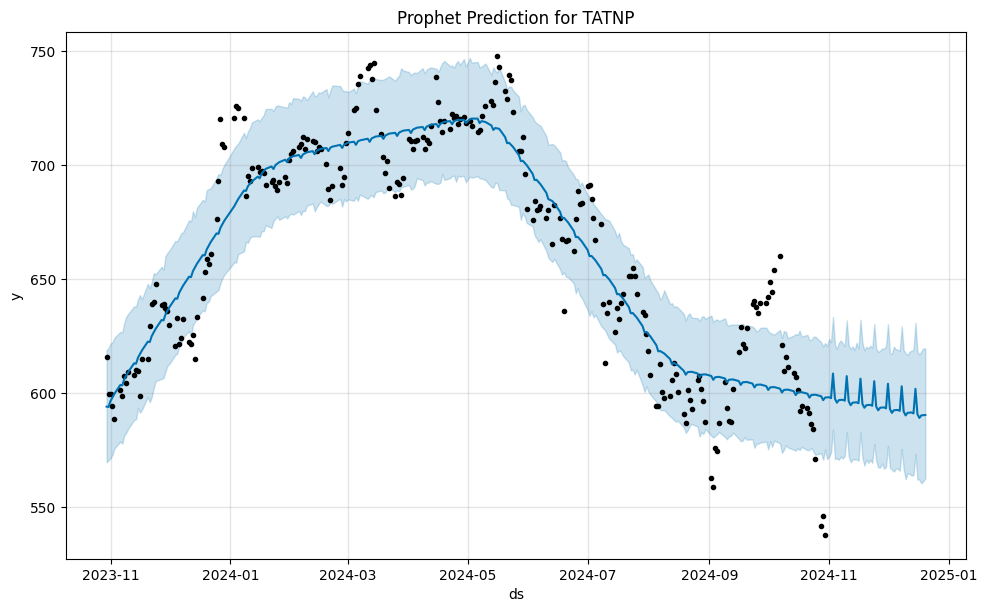

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/2p3f0hi_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/4izom0iv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59215', 'data', 'file=/tmp/tmp3e5fuz45/2p3f0hi_.json', 'init=/tmp/tmp3e5fuz45/4izom0iv.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model6ztygsyw/prophet_model-20241210130441.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:04:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Results for TATNP:
  MSE = 893.1038325252214
  MAE = 23.321016350156597
  RMSE = 29.88484285595662
  MAPE = 0.04%
  R² = -0.10760805438972221



13:04:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


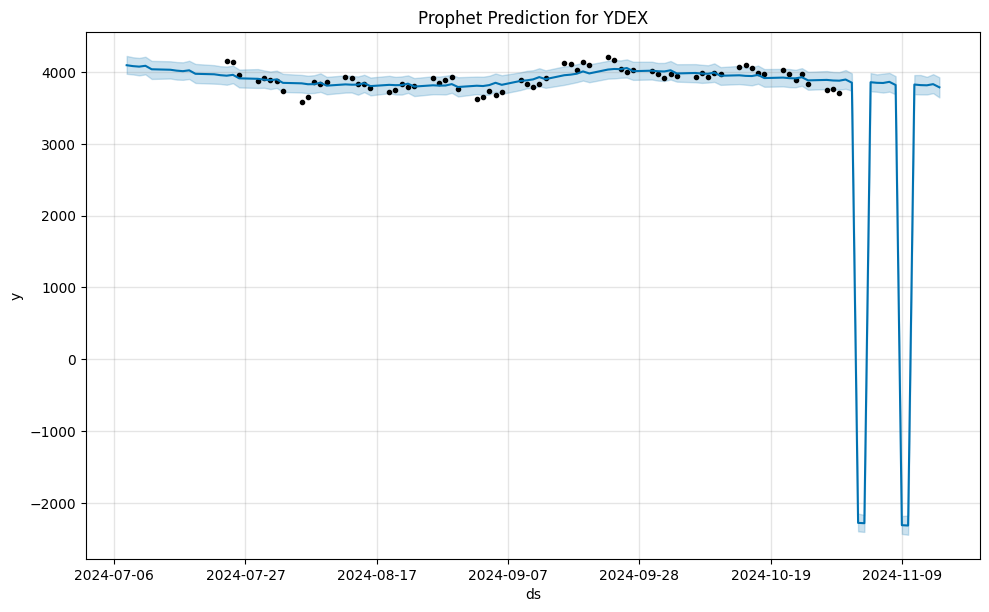

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/53c0l00i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/f_ogh3fv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24702', 'data', 'file=/tmp/tmp3e5fuz45/53c0l00i.json', 'init=/tmp/tmp3e5fuz45/f_ogh3fv.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelhm0to8qr/prophet_model-20241210130442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for YDEX:
  MSE = 9838676.780212676
  MAE = 1658.2028028446928
  RMSE = 3136.666507649909
  MAPE = 0.42%
  R² = -754.2092095882002



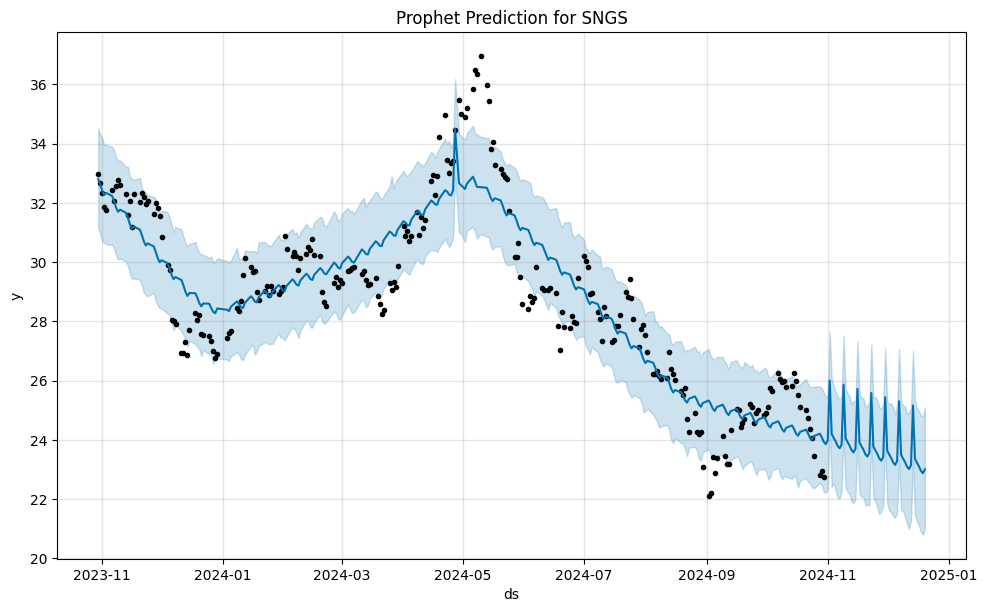

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/ewhyorem.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/ti7bqak_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32642', 'data', 'file=/tmp/tmp3e5fuz45/ewhyorem.json', 'init=/tmp/tmp3e5fuz45/ti7bqak_.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_model5486iq51/prophet_model-20241210130443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for SNGS:
  MSE = 2.5487320778395572
  MAE = 1.2997672104849942
  RMSE = 1.5964748910770745
  MAPE = 0.05%
  R² = -1.159100375771668



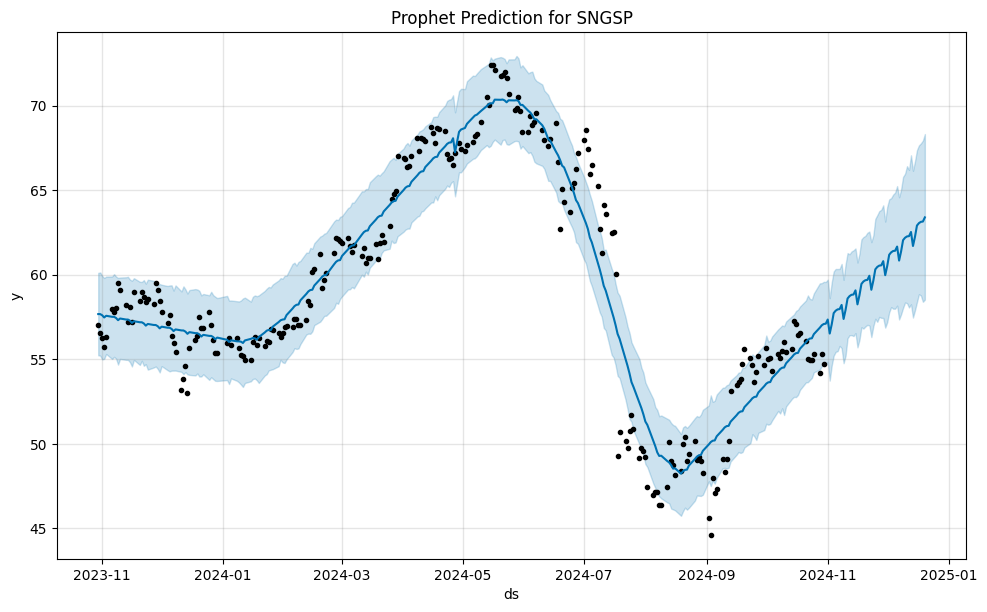

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/_rg0tzzp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/fwi980wk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19189', 'data', 'file=/tmp/tmp3e5fuz45/_rg0tzzp.json', 'init=/tmp/tmp3e5fuz45/fwi980wk.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelxh09_hxo/prophet_model-20241210130444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for SNGSP:
  MSE = 56.589794290079915
  MAE = 7.21436449171763
  RMSE = 7.522618845194798
  MAPE = 0.14%
  R² = -4.098615018279212



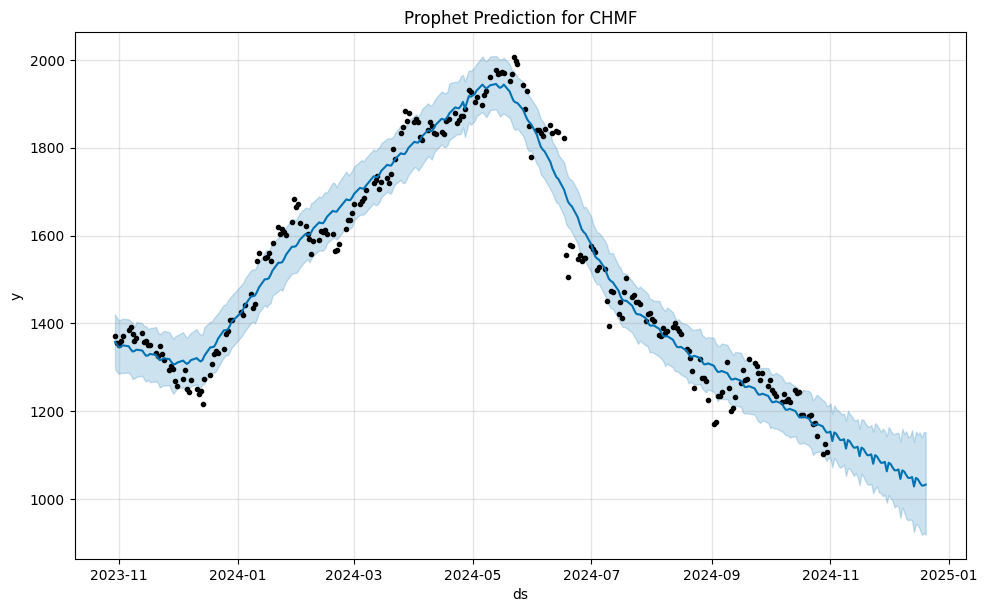

DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/npfywz73.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3e5fuz45/ot8ivai8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37498', 'data', 'file=/tmp/tmp3e5fuz45/npfywz73.json', 'init=/tmp/tmp3e5fuz45/ot8ivai8.json', 'output', 'file=/tmp/tmp3e5fuz45/prophet_modelq45epgyf/prophet_model-20241210130445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results for CHMF:
  MSE = 23126.84036428633
  MAE = 146.17871014011985
  RMSE = 152.07511421756791
  MAPE = 0.12%
  R² = -7.327296041196128



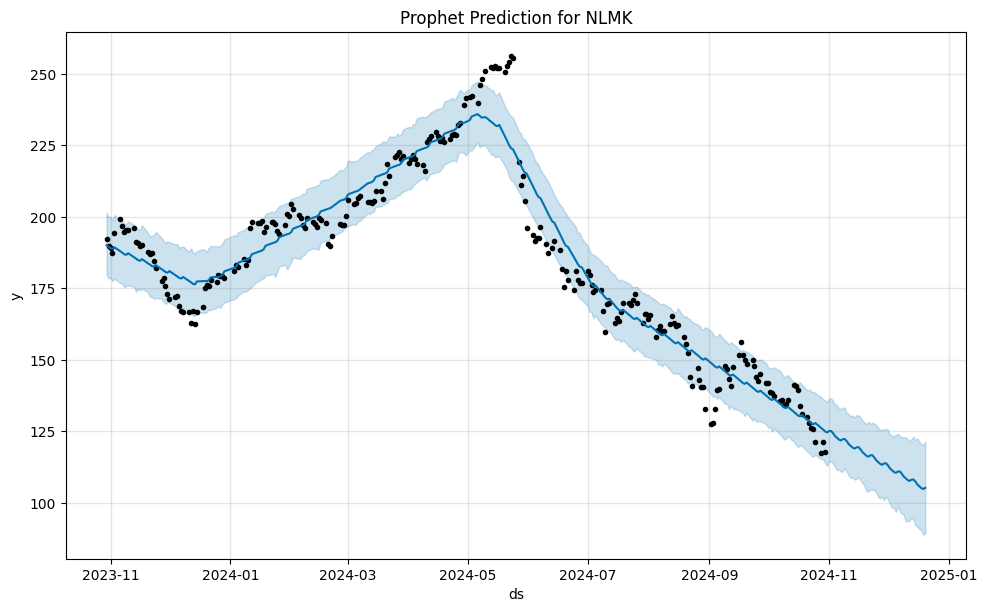

Results for NLMK:
  MSE = 614.7093442195296
  MAE = 23.629405614445364
  RMSE = 24.793332656573817
  MAPE = 0.17%
  R² = -6.370352005729734



In [20]:
import logging

logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

def prophet_baseline(ticker_data):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    df_prophet = ticker_data[['TRADEDATE', 'CLOSE']].rename(columns={'TRADEDATE': 'ds', 'CLOSE': 'y'})

    model = Prophet()
    model.fit(df_prophet)

    future = model.make_future_dataframe(periods=int(len(ticker_data) * 0.2))
    forecast = model.predict(future)

    test = df_prophet['y'][-int(len(ticker_data) * 0.2):]
    pred = forecast['yhat'][-int(len(ticker_data) * 0.2):]
    mse = mean_squared_error(test, pred)
    mae = mean_absolute_error(test, pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(test, pred)
    r2 = r2_score(test, pred)

    model.plot(forecast)
    plt.title(f'Prophet Prediction for {ticker_data["TICKER"].iloc[0]}')
    plt.show()

    return mse, mae, rmse, mape, r2, model

prophet_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = prophet_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2, model = result
            prophet_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")


In [21]:
print("\nProphet Model Results Summary:")
for ticker, metrics in prophet_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


Prophet Model Results Summary:
SBER: MSE = 242.21808115779848, MAE = 14.008912738992072, RMSE = 15.563357001553312, MAPE = 0.05%, R² = -3.2034515773457395
SBERP: MSE = 230.35222612054352, MAE = 13.596155191251778, RMSE = 15.177358996892163, MAPE = 0.05%, R² = -3.0108043386484784
ROSN: MSE = 671.1015708606303, MAE = 21.08894267421303, RMSE = 25.905628169581803, MAPE = 0.04%, R² = -0.5122771433664066
SIBN: MSE = 2240.9596032817676, MAE = 39.31602146189226, RMSE = 47.338774839255905, MAPE = 0.06%, R² = -0.40485892269261803
NVTK: MSE = 4574.969224644173, MAE = 60.71657354109082, RMSE = 67.63851879398435, MAPE = 0.06%, R² = -2.243586664523598
LKOH: MSE = 368763.5691286973, MAE = 572.762880830423, RMSE = 607.2590626155342, MAPE = 0.09%, R² = -3.9727595944283918
GAZP: MSE = 98.77637035018253, MAE = 8.129244288894332, RMSE = 9.93863020492173, MAPE = 0.07%, R² = -1.3577978094648069
GMKN: MSE = 6530294.7032224955, MAE = 1953.920603057431, RMSE = 2555.4441303269564, MAPE = 18.29%, R² = -237977.8

### LSTM

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step


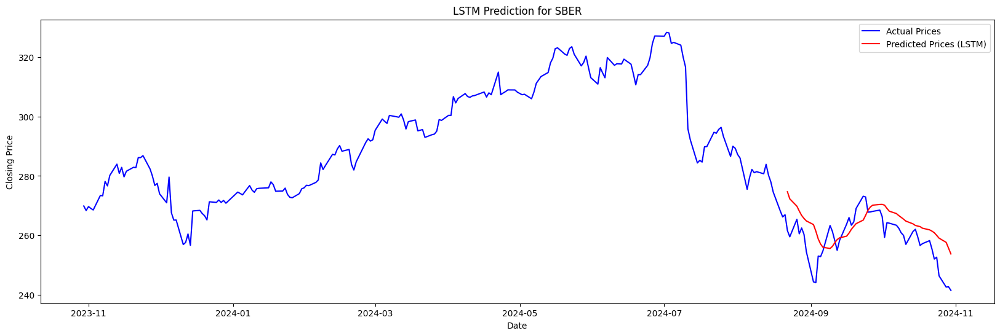

Results for SBER:
  MSE = 57.78829448624541
  MAE = 6.204301904296878
  RMSE = 7.60186125144661
  MAPE = 0.02%
  R² = -0.0032314109736966135

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step


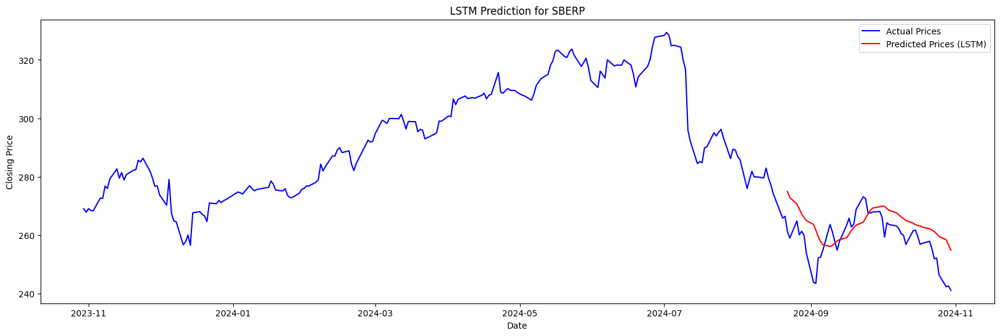

Results for SBERP:
  MSE = 65.27945029722743
  MAE = 6.592139257812493
  RMSE = 8.079569932689946
  MAPE = 0.03%
  R² = -0.13560288493789563



1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step


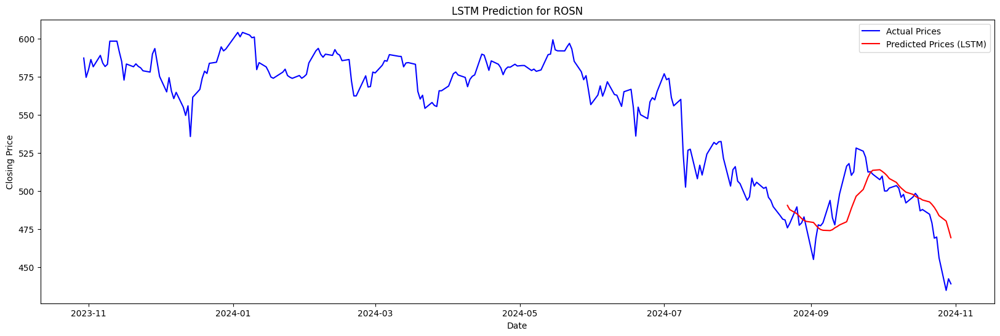

Results for ROSN:
  MSE = 272.9763167818508
  MAE = 12.19616320800781
  RMSE = 16.521994939529876
  MAPE = 0.03%
  R² = 0.3949909160158801

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step


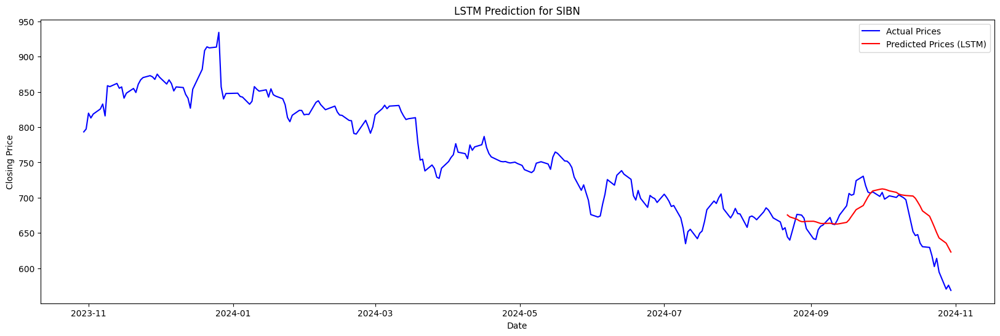

Results for SIBN:
  MSE = 920.5372318300485
  MAE = 23.06763232421875
  RMSE = 30.340356488183335
  MAPE = 0.04%
  R² = 0.43364872374755015

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 406ms/step


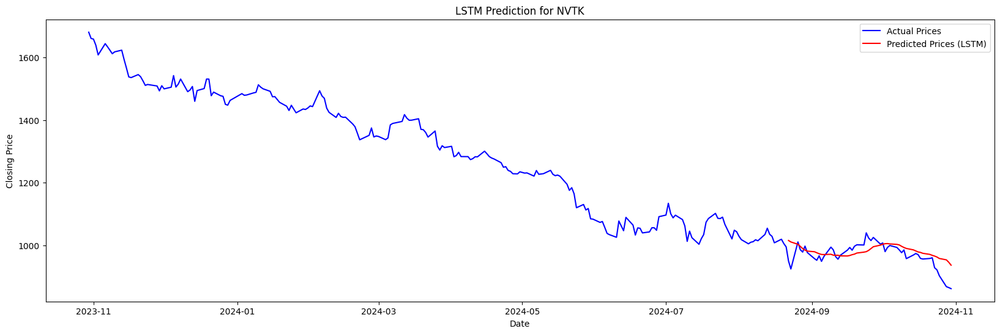

Results for NVTK:
  MSE = 1085.502787433422
  MAE = 24.582764648437497
  RMSE = 32.94696932091664
  MAPE = 0.03%
  R² = 0.23920978143585359

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step


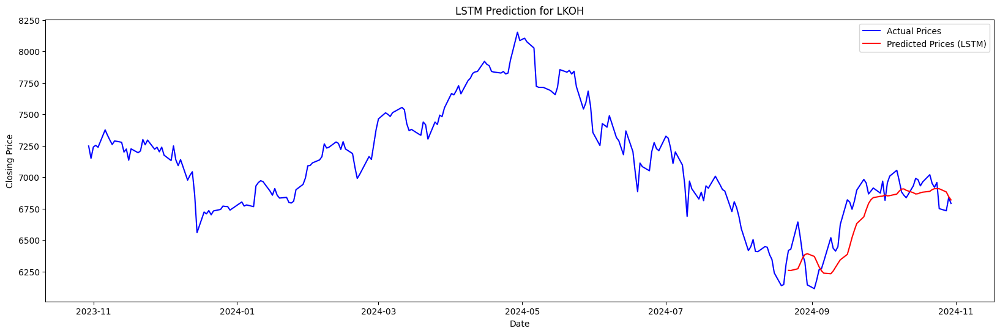

Results for LKOH:
  MSE = 29487.401534905435
  MAE = 137.885322265625
  RMSE = 171.71896090678348
  MAPE = 0.02%
  R² = 0.5920610608265748

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step


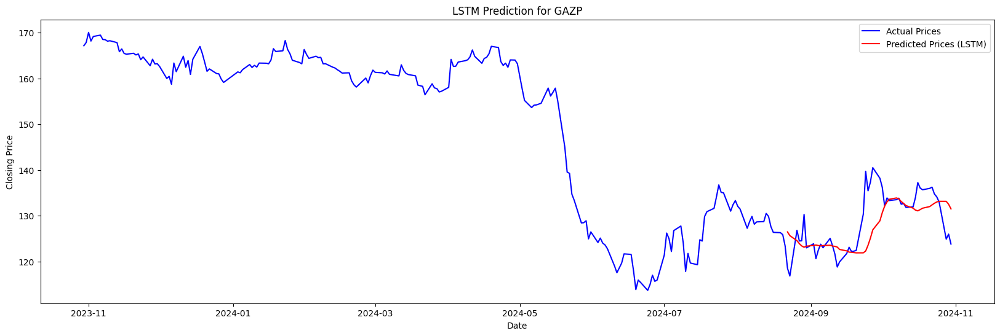

Results for GAZP:
  MSE = 30.11015693019163
  MAE = 3.5863602416992184
  RMSE = 5.487272266818152
  MAPE = 0.03%
  R² = 0.2854832444275608

Error: Ticker GMKN contains NaN values. Skipping this ticker.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step


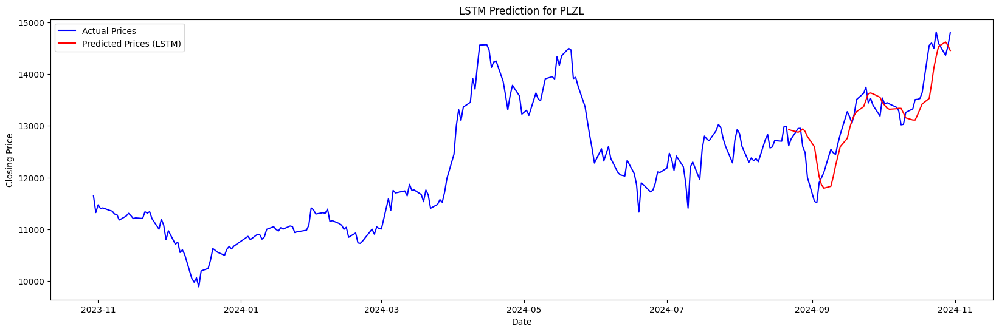

Results for PLZL:
  MSE = 146717.38199068067
  MAE = 291.93693359375
  RMSE = 383.03705041507493
  MAPE = 0.02%
  R² = 0.7726200276795288

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step


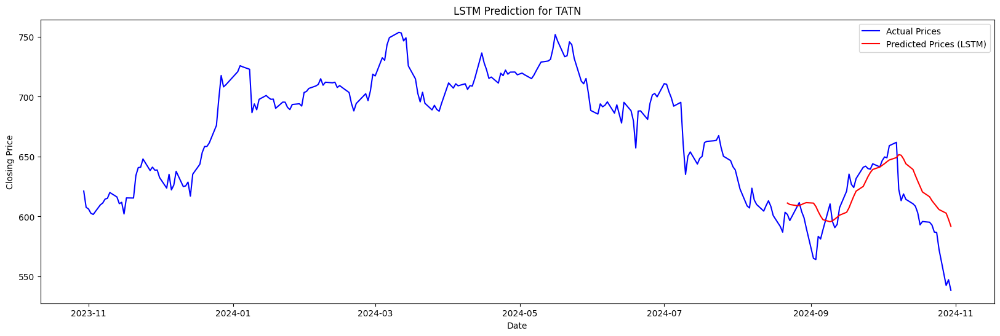

Results for TATN:
  MSE = 569.3347662269085
  MAE = 18.931316162109376
  RMSE = 23.86073691709685
  MAPE = 0.03%
  R² = 0.32475737400343707

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 431ms/step


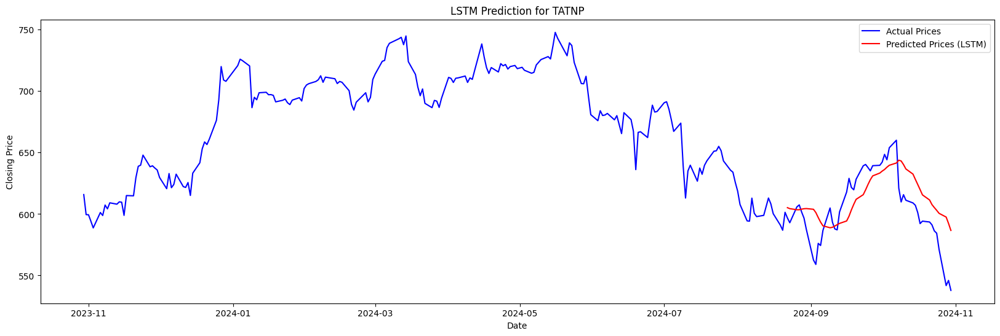

Results for TATNP:
  MSE = 500.3260076279371
  MAE = 18.59455981445312
  RMSE = 22.36796833930022
  MAPE = 0.03%
  R² = 0.3915192564671356

Error: Ticker YDEX contains NaN values. Skipping this ticker.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 414ms/step


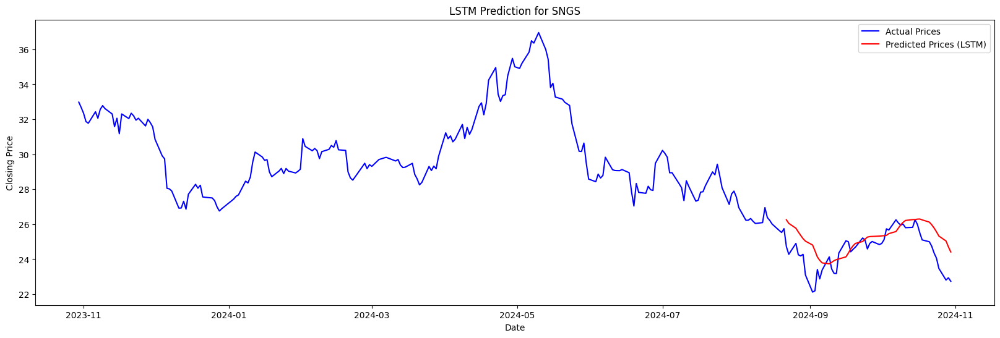

Results for SNGS:
  MSE = 1.1382873387575208
  MAE = 0.8355119705200196
  RMSE = 1.0669054966385358
  MAPE = 0.04%
  R² = 0.030574264234669135

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step


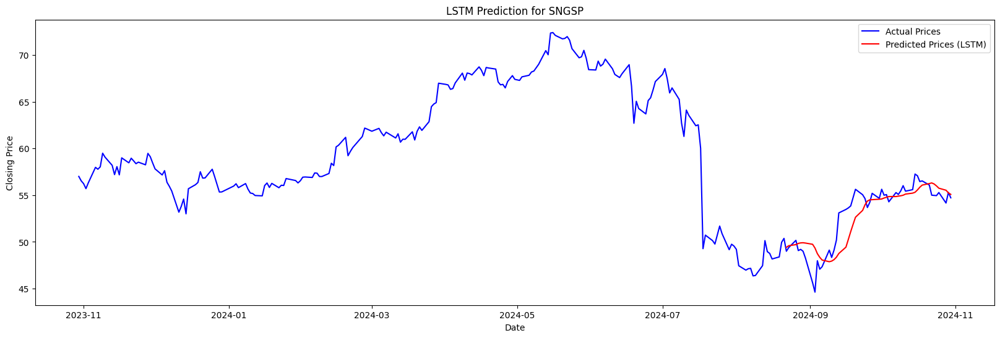

Results for SNGSP:
  MSE = 2.9047788559183476
  MAE = 1.2228992614746097
  RMSE = 1.704341179435135
  MAPE = 0.02%
  R² = 0.7404960689492931

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step


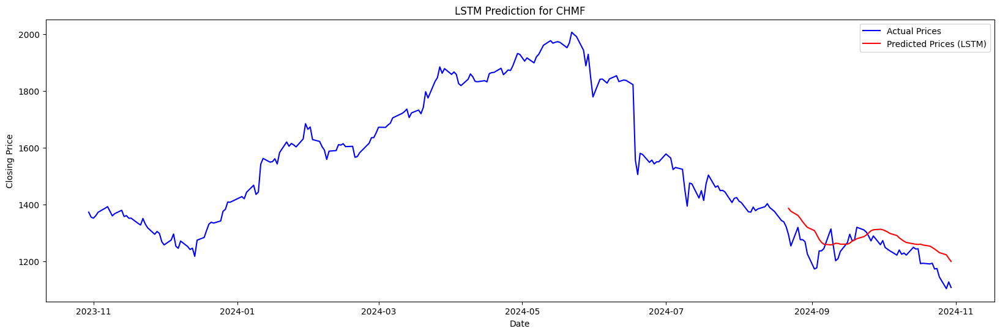

Results for CHMF:
  MSE = 3760.1701274817815
  MAE = 52.025517089843746
  RMSE = 61.32022608798651
  MAPE = 0.04%
  R² = -0.39795000185955454

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step


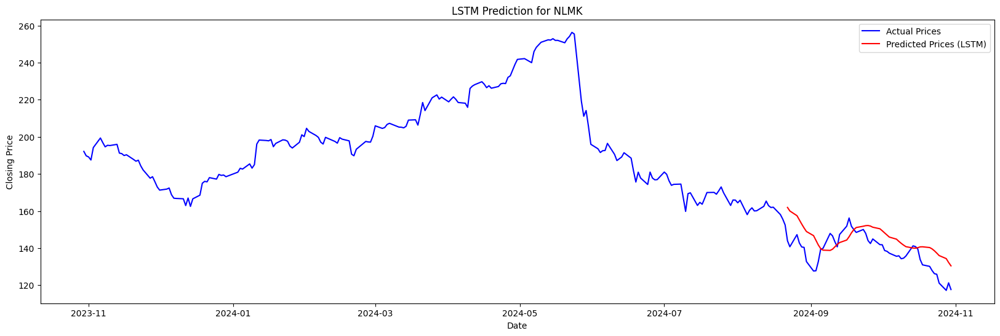

Results for NLMK:
  MSE = 97.5311849902293
  MAE = 8.482178601074219
  RMSE = 9.875787816181012
  MAPE = 0.06%
  R² = -0.20189927874859093



In [22]:
def lstm_baseline(ticker_data, window_size=10):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values.reshape(-1, 1)
    dates = ticker_data['TRADEDATE'].values

    if np.isnan(ticker_data_values).sum() > 0:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} contains NaN values. Skipping this ticker.")
        return None

    scaler = MinMaxScaler(feature_range=(0, 1))
    ticker_data_scaled = scaler.fit_transform(ticker_data_values)

    try:
        X, y = prepare_data(ticker_data_scaled, window_size)
        train_size = int(len(X) * 0.8)
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
        X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

        model = Sequential()
        model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
        model.add(LSTM(50))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mean_squared_error')

        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        predictions = model.predict(X_test)
        predictions = scaler.inverse_transform(predictions)
        y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        train_dates = dates[:train_size + window_size]
        test_dates = dates[train_size + window_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (LSTM)', color='red')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f"LSTM Prediction for {ticker_data['TICKER'].iloc[0]}")
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2, model

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None


lstm_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = lstm_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2, model = result
            lstm_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")

In [23]:
print("\nLSTM Model Results Summary:")
for ticker, metrics in lstm_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")



LSTM Model Results Summary:
SBER: MSE = 57.78829448624541, MAE = 6.204301904296878, RMSE = 7.60186125144661, MAPE = 0.02%, R² = -0.0032314109736966135
SBERP: MSE = 65.27945029722743, MAE = 6.592139257812493, RMSE = 8.079569932689946, MAPE = 0.03%, R² = -0.13560288493789563
ROSN: MSE = 272.9763167818508, MAE = 12.19616320800781, RMSE = 16.521994939529876, MAPE = 0.03%, R² = 0.3949909160158801
SIBN: MSE = 920.5372318300485, MAE = 23.06763232421875, RMSE = 30.340356488183335, MAPE = 0.04%, R² = 0.43364872374755015
NVTK: MSE = 1085.502787433422, MAE = 24.582764648437497, RMSE = 32.94696932091664, MAPE = 0.03%, R² = 0.23920978143585359
LKOH: MSE = 29487.401534905435, MAE = 137.885322265625, RMSE = 171.71896090678348, MAPE = 0.02%, R² = 0.5920610608265748
GAZP: MSE = 30.11015693019163, MAE = 3.5863602416992184, RMSE = 5.487272266818152, MAPE = 0.03%, R² = 0.2854832444275608
PLZL: MSE = 146717.38199068067, MAE = 291.93693359375, RMSE = 383.03705041507493, MAPE = 0.02%, R² = 0.772620027679528

### Реализация модели GRU

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 312ms/step


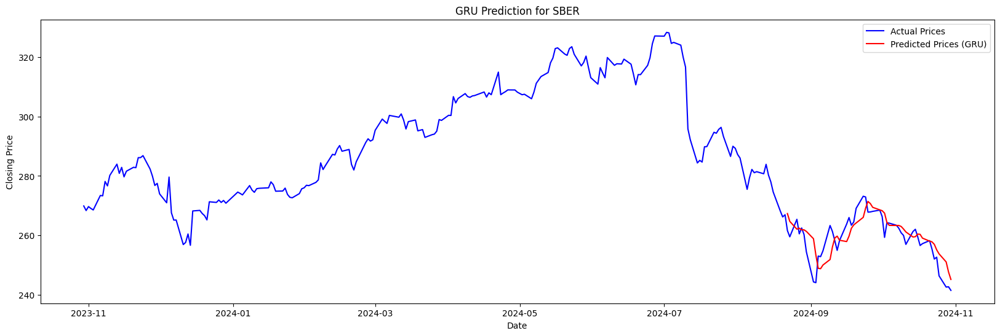

Results for SBER:
  MSE = 23.59807575977003
  MAE = 3.7660712280273434
  RMSE = 4.857785067267801
  MAPE = 0.01%
  R² = 0.5903265349633537

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 322ms/step


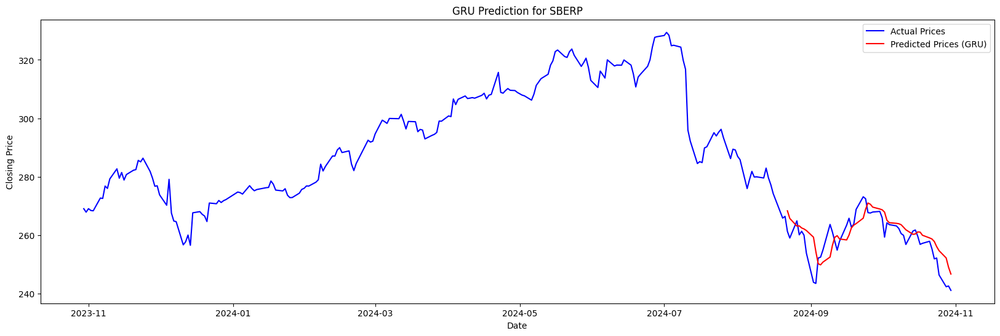

Results for SBERP:
  MSE = 27.214433605045798
  MAE = 4.098477685546869
  RMSE = 5.216745499355493
  MAPE = 0.02%
  R² = 0.5265770595014734

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 339ms/step


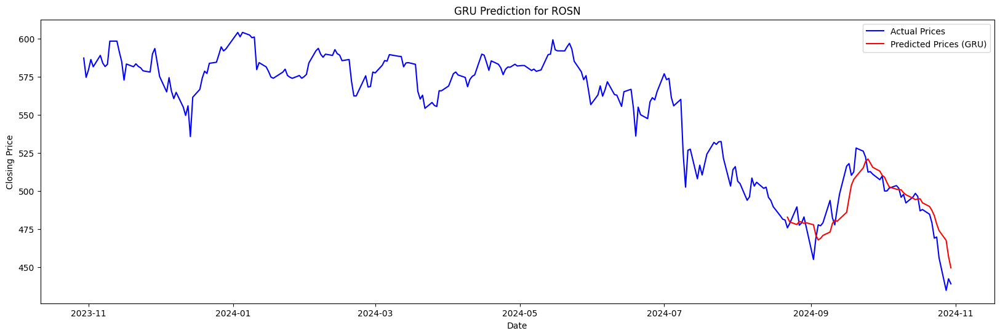

Results for ROSN:
  MSE = 125.74755269577575
  MAE = 8.326954956054687
  RMSE = 11.213721625569976
  MAPE = 0.02%
  R² = 0.7213003217033138

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 312ms/step


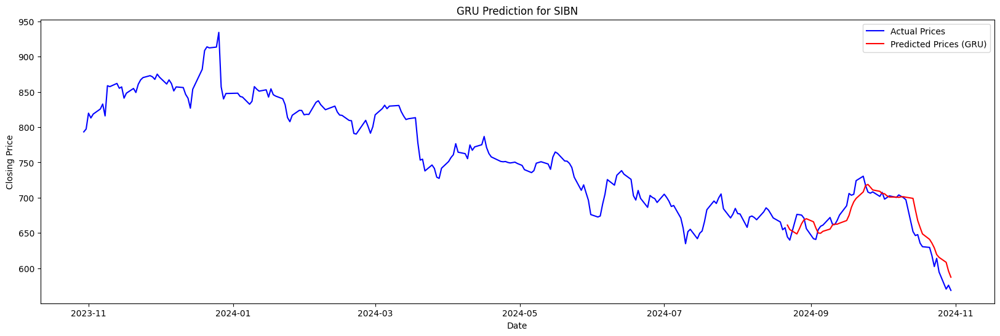

Results for SIBN:
  MSE = 307.1868954940169
  MAE = 13.790685302734373
  RMSE = 17.52674800109869
  MAPE = 0.02%
  R² = 0.8110063511877766

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 336ms/step


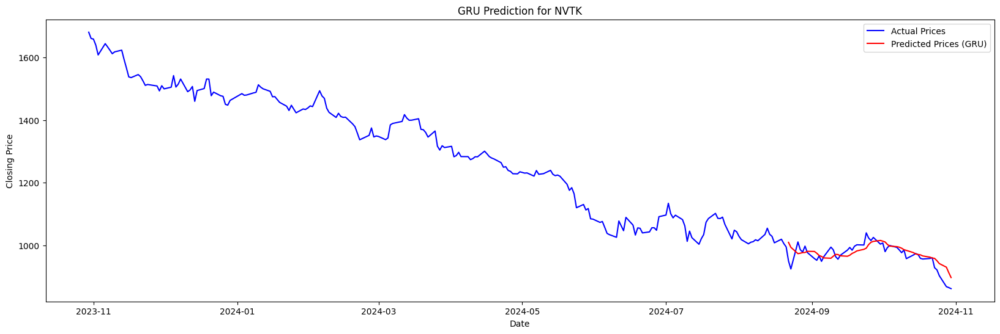

Results for NVTK:
  MSE = 635.1889522623337
  MAE = 18.725214111328125
  RMSE = 25.202955228749143
  MAPE = 0.02%
  R² = 0.5548187002229774

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 311ms/step


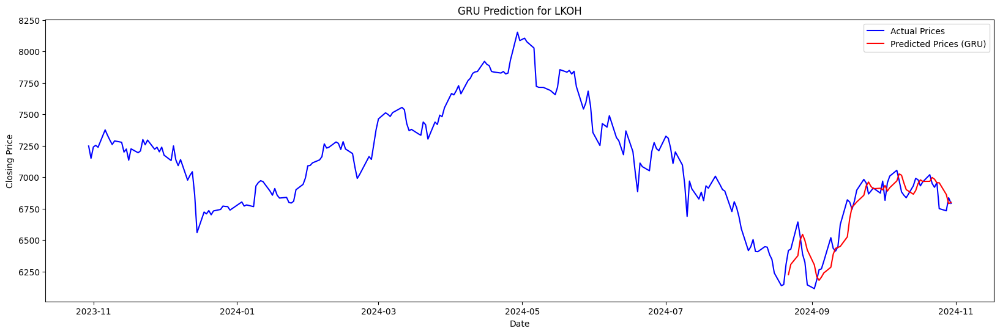

Results for LKOH:
  MSE = 14048.302505640984
  MAE = 92.589580078125
  RMSE = 118.5255352472242
  MAPE = 0.01%
  R² = 0.8056509111338713

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 349ms/step


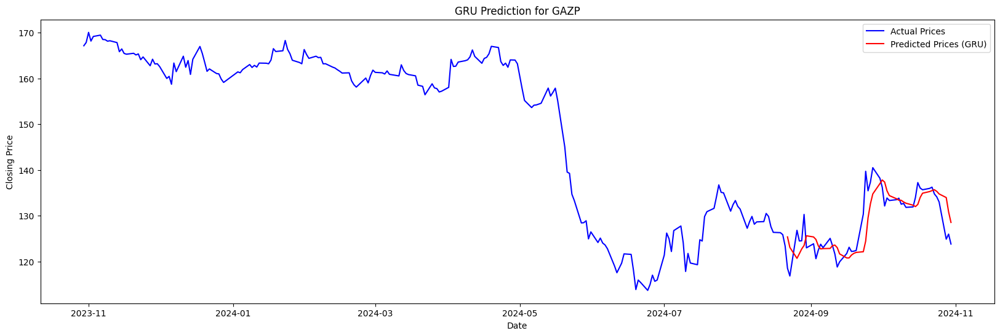

Results for GAZP:
  MSE = 16.819010131488877
  MAE = 2.868602911376954
  RMSE = 4.1010986493242125
  MAPE = 0.02%
  R² = 0.6008833637448951

Error: Ticker GMKN contains NaN values. Skipping this ticker.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 347ms/step


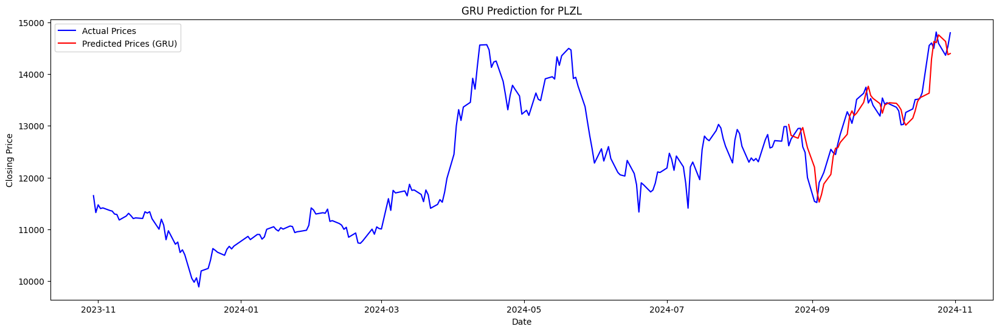

Results for PLZL:
  MSE = 80544.69333026896
  MAE = 219.74394531250007
  RMSE = 283.8039698987119
  MAPE = 0.02%
  R² = 0.8751732760528627

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step


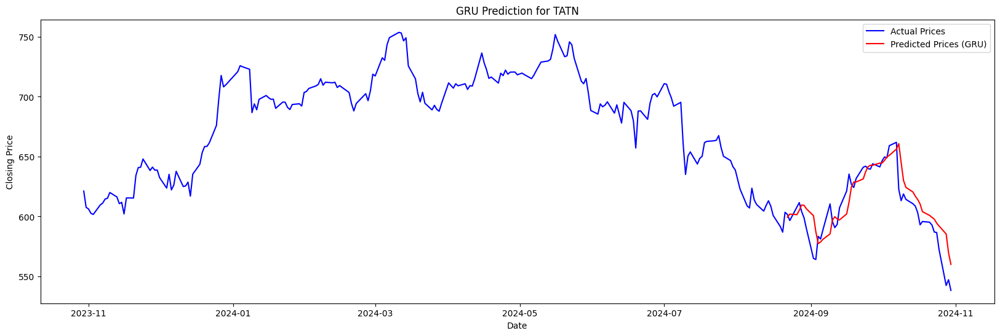

Results for TATN:
  MSE = 226.11821368206137
  MAE = 11.144458496093751
  RMSE = 15.03722759294616
  MAPE = 0.02%
  R² = 0.7318191941725292

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 331ms/step


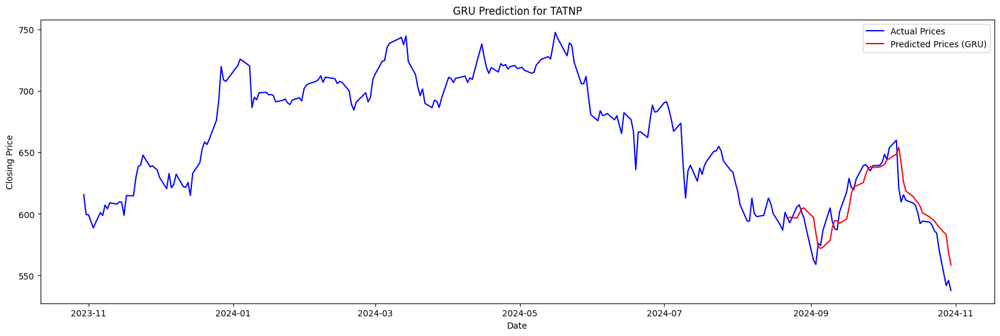

Results for TATNP:
  MSE = 217.54071660612823
  MAE = 10.972496582031242
  RMSE = 14.749261561384293
  MAPE = 0.02%
  R² = 0.735433827202514

Error: Ticker YDEX contains NaN values. Skipping this ticker.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 316ms/step


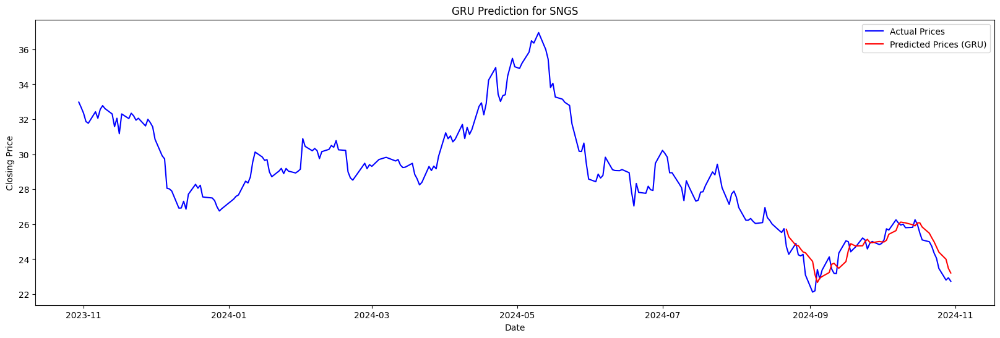

Results for SNGS:
  MSE = 0.38987929622415346
  MAE = 0.49689113769531246
  RMSE = 0.6244031519972921
  MAPE = 0.02%
  R² = 0.6679581589527961

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 495ms/step


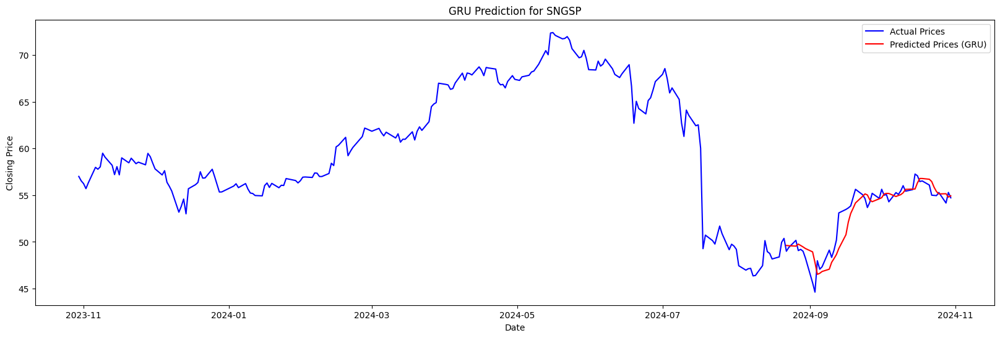

Results for SNGSP:
  MSE = 1.5192867912544983
  MAE = 0.8965286102294923
  RMSE = 1.232593522315649
  MAPE = 0.02%
  R² = 0.8642716315837023

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 322ms/step


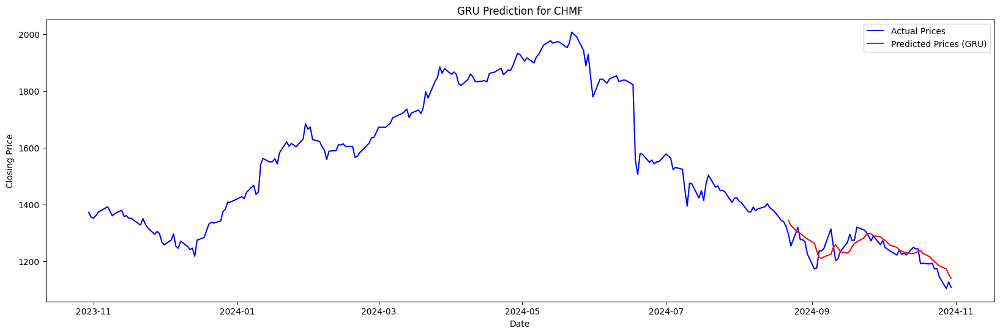

Results for CHMF:
  MSE = 1304.8551389146087
  MAE = 28.892086914062492
  RMSE = 36.1227786710077
  MAPE = 0.02%
  R² = 0.5148830552798

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 324ms/step


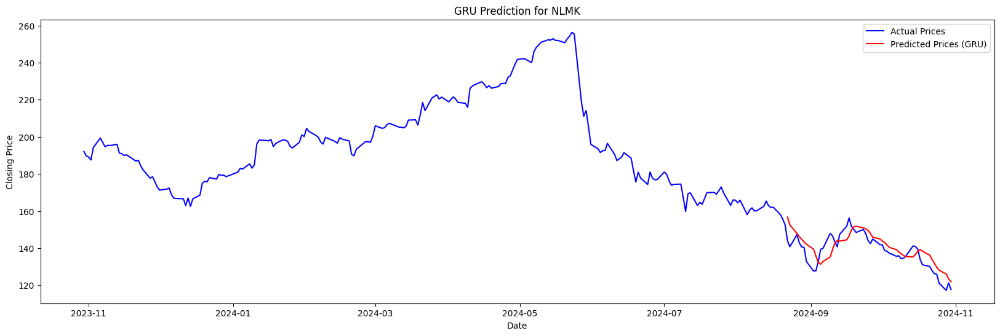

Results for NLMK:
  MSE = 34.021231813822276
  MAE = 4.817407116699219
  RMSE = 5.832772223721948
  MAPE = 0.04%
  R² = 0.5807485166588718



In [24]:
def gru_baseline(ticker_data, window_size=10):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values.reshape(-1, 1)
    dates = ticker_data['TRADEDATE'].values

    if np.isnan(ticker_data_values).sum() > 0:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} contains NaN values. Skipping this ticker.")
        return None

    scaler = MinMaxScaler(feature_range=(0, 1))
    ticker_data_scaled = scaler.fit_transform(ticker_data_values)

    try:
        X, y = prepare_data(ticker_data_scaled, window_size)
        train_size = int(len(X) * 0.8)
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
        X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

        model = Sequential()
        model.add(GRU(50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
        model.add(GRU(50))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mean_squared_error')

        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        predictions = model.predict(X_test)
        predictions = scaler.inverse_transform(predictions)
        y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        train_dates = dates[:train_size + window_size]
        test_dates = dates[train_size + window_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (GRU)', color='red')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'GRU Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2, model

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

gru_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = gru_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2, model = result
            gru_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")


In [25]:
print("\nGRU Model Results Summary:")
for ticker, metrics in gru_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


GRU Model Results Summary:
SBER: MSE = 23.59807575977003, MAE = 3.7660712280273434, RMSE = 4.857785067267801, MAPE = 0.01%, R² = 0.5903265349633537
SBERP: MSE = 27.214433605045798, MAE = 4.098477685546869, RMSE = 5.216745499355493, MAPE = 0.02%, R² = 0.5265770595014734
ROSN: MSE = 125.74755269577575, MAE = 8.326954956054687, RMSE = 11.213721625569976, MAPE = 0.02%, R² = 0.7213003217033138
SIBN: MSE = 307.1868954940169, MAE = 13.790685302734373, RMSE = 17.52674800109869, MAPE = 0.02%, R² = 0.8110063511877766
NVTK: MSE = 635.1889522623337, MAE = 18.725214111328125, RMSE = 25.202955228749143, MAPE = 0.02%, R² = 0.5548187002229774
LKOH: MSE = 14048.302505640984, MAE = 92.589580078125, RMSE = 118.5255352472242, MAPE = 0.01%, R² = 0.8056509111338713
GAZP: MSE = 16.819010131488877, MAE = 2.868602911376954, RMSE = 4.1010986493242125, MAPE = 0.02%, R² = 0.6008833637448951
PLZL: MSE = 80544.69333026896, MAE = 219.74394531250007, RMSE = 283.8039698987119, MAPE = 0.02%, R² = 0.8751732760528627
TA

### Nonlinear Autoregressive Models (NAR/NARX)

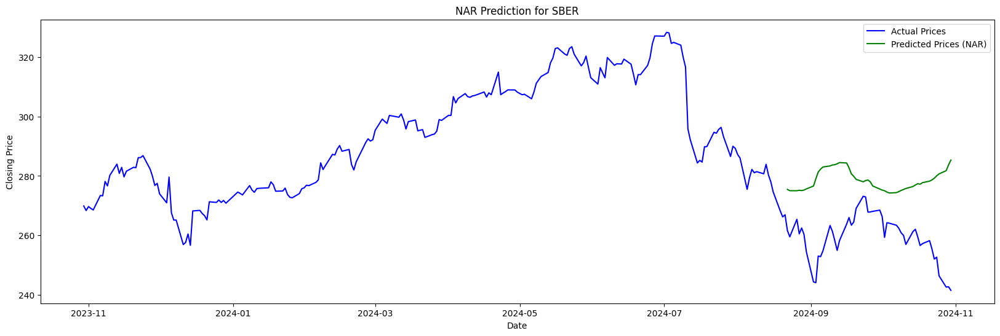

Results for SBER:
  MSE = 462.57846166850356
  MAE = 19.371883745919508
  RMSE = 21.50763728698491
  MAPE = 0.08%
  R² = -7.030575169443569



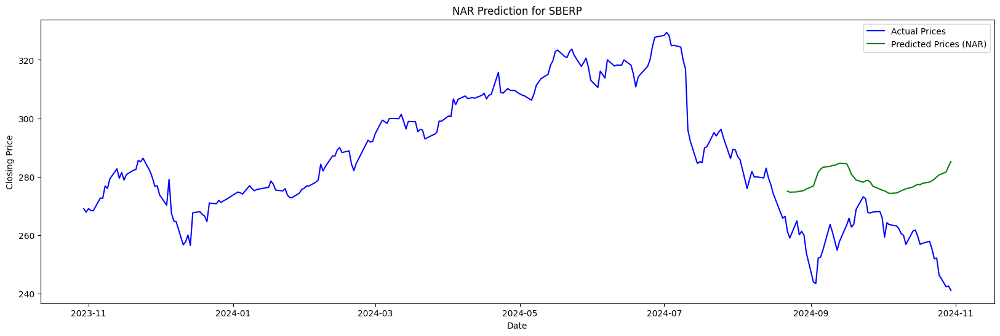

Results for SBERP:
  MSE = 473.18803445389005
  MAE = 19.657296713242076
  RMSE = 21.752885658088907
  MAPE = 0.08%
  R² = -7.2315904101103055



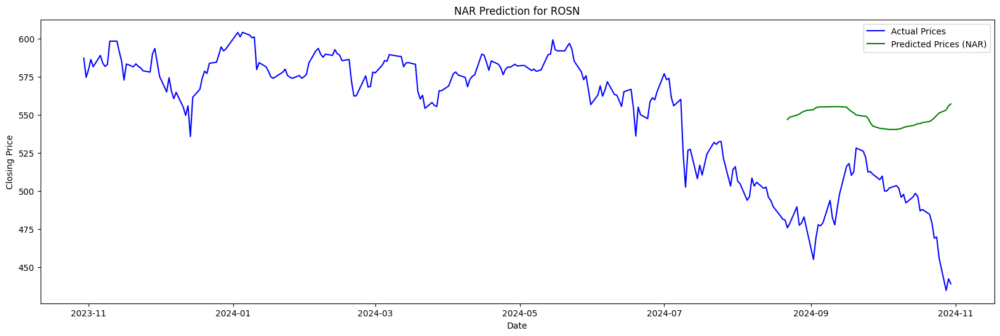

Results for ROSN:
  MSE = 4070.100097947614
  MAE = 59.0932485801881
  RMSE = 63.79733613519936
  MAPE = 0.12%
  R² = -8.020736894002527



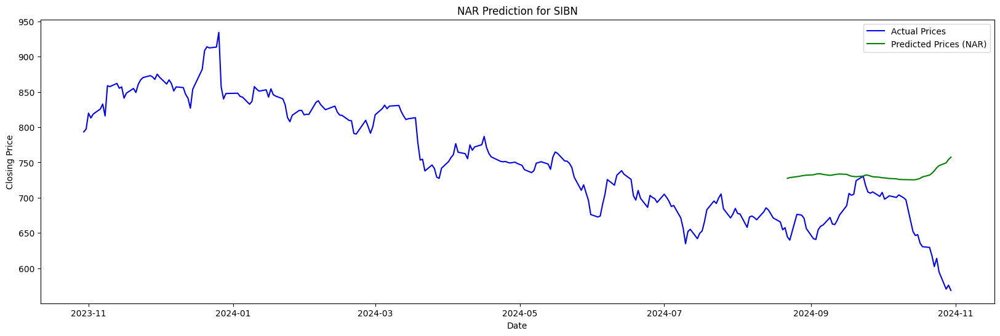

Results for SIBN:
  MSE = 6347.677073514817
  MAE = 65.47138951724314
  RMSE = 79.67231058225195
  MAPE = 0.10%
  R² = -2.905344496144455



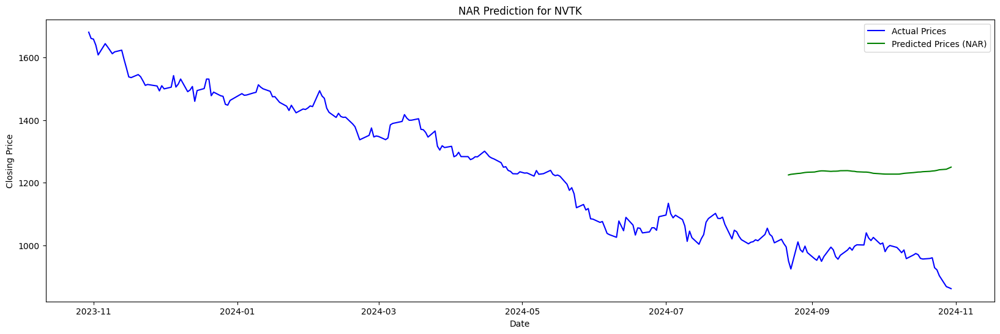

Results for NVTK:
  MSE = 71207.33622531907
  MAE = 263.651785934254
  RMSE = 266.84702776182286
  MAPE = 0.27%
  R² = -48.906684273303924



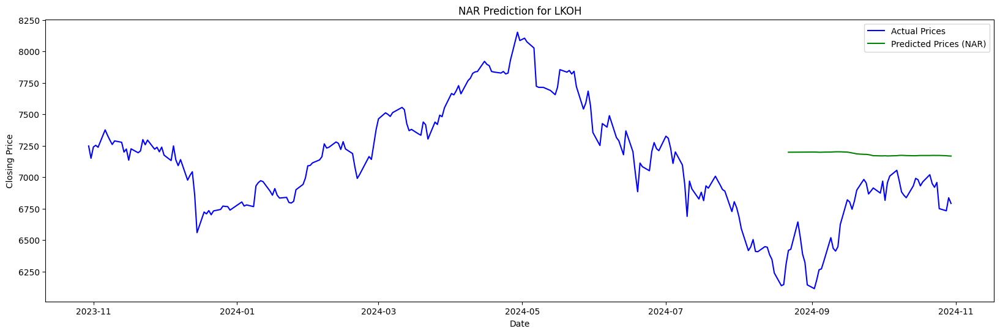

Results for LKOH:
  MSE = 290543.9114600912
  MAE = 460.6237474676258
  RMSE = 539.0212532545365
  MAPE = 0.07%
  R² = -3.0194852328383464



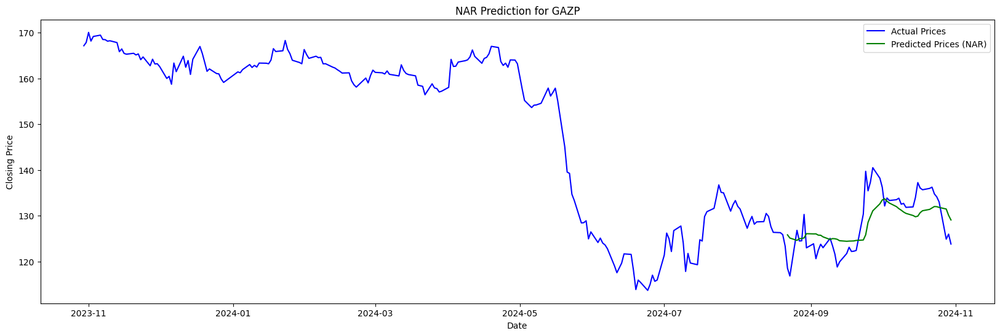

Results for GAZP:
  MSE = 21.145420677911957
  MAE = 3.726116145257349
  RMSE = 4.598415018015659
  MAPE = 0.03%
  R² = 0.49821724898263875

Unexpected error for ticker GMKN: Input X contains NaN.
SVR does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values


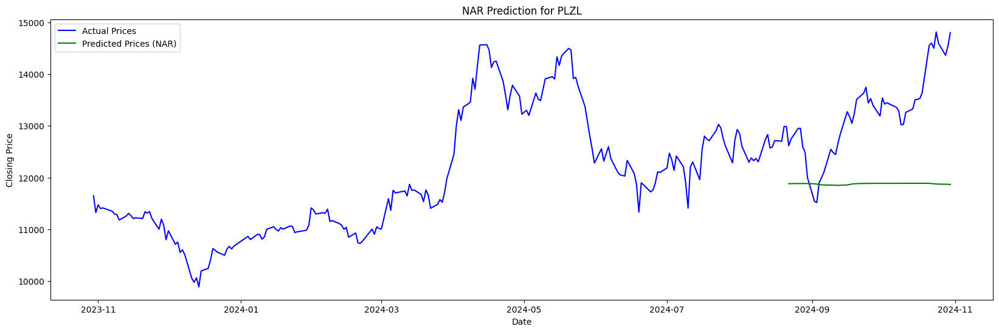

Results for PLZL:
  MSE = 2473165.196637323
  MAE = 1381.927812009241
  RMSE = 1572.6300253515838
  MAPE = 0.10%
  R² = -2.832867151290002



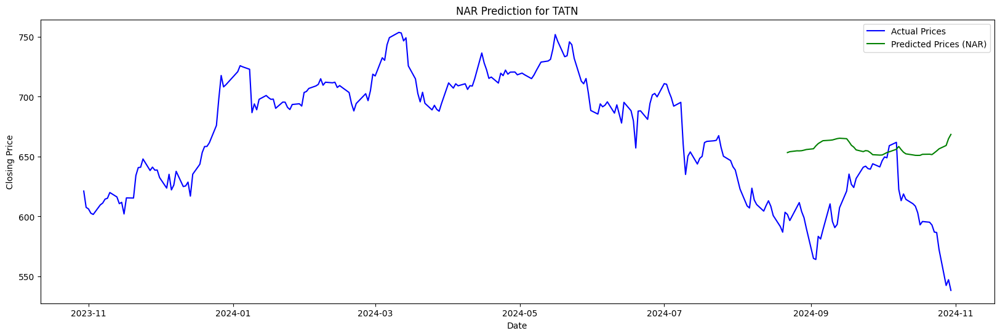

Results for TATN:
  MSE = 3373.5808411783046
  MAE = 49.34254955814481
  RMSE = 58.082534734447535
  MAPE = 0.08%
  R² = -3.001135573198143



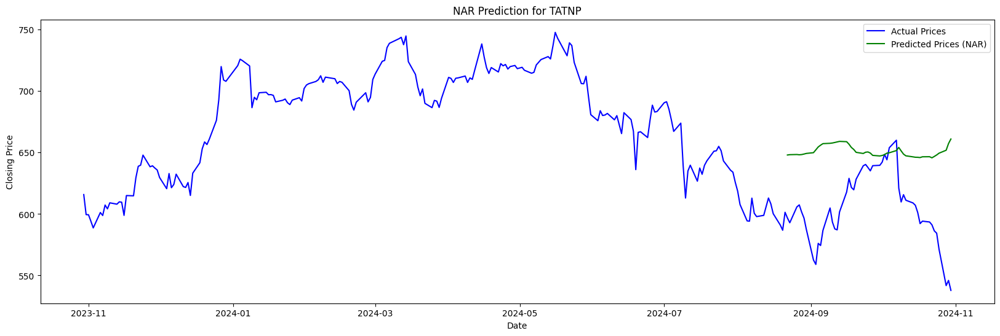

Results for TATNP:
  MSE = 3063.1426987203913
  MAE = 46.91386991258148
  RMSE = 55.345665582052504
  MAPE = 0.08%
  R² = -2.7252977427683387

Unexpected error for ticker YDEX: Input X contains NaN.
SVR does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values


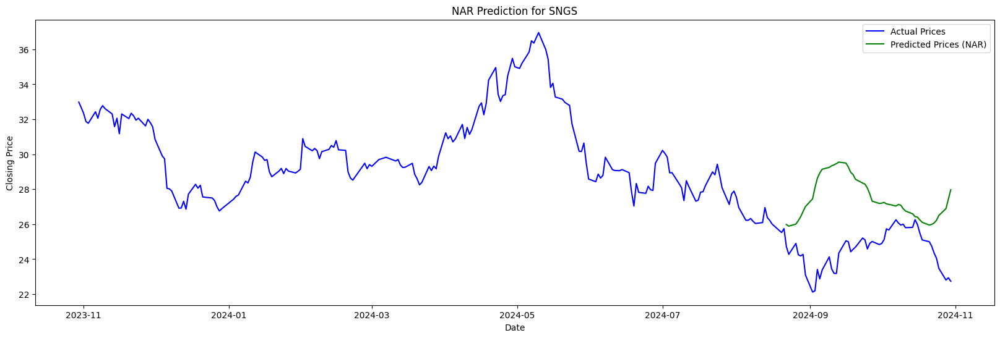

Results for SNGS:
  MSE = 12.199568500353946
  MAE = 2.969632864417244
  RMSE = 3.4927880697737654
  MAPE = 0.12%
  R² = -9.38979813513896



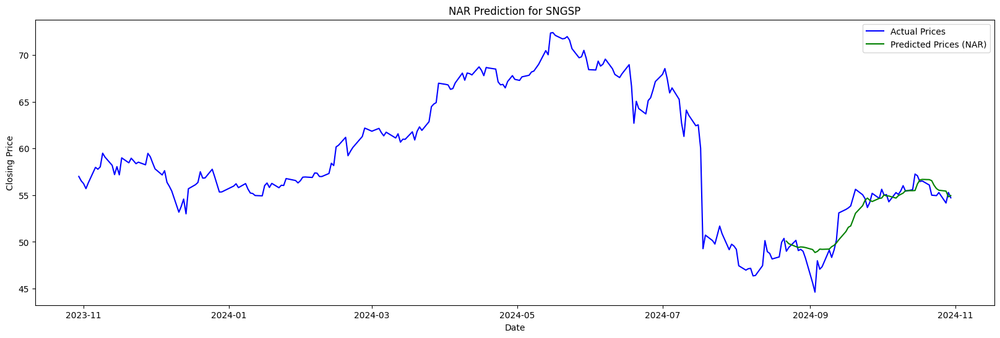

Results for SNGSP:
  MSE = 1.9186242121022432
  MAE = 1.001130182276504
  RMSE = 1.3851441123948955
  MAPE = 0.02%
  R² = 0.828596065330354



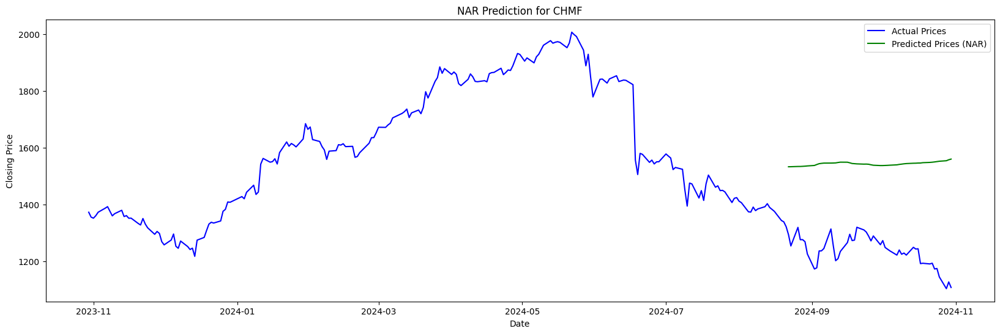

Results for CHMF:
  MSE = 97349.70059291154
  MAE = 306.9494198615741
  RMSE = 312.0091354318196
  MAPE = 0.25%
  R² = -35.192515101977165



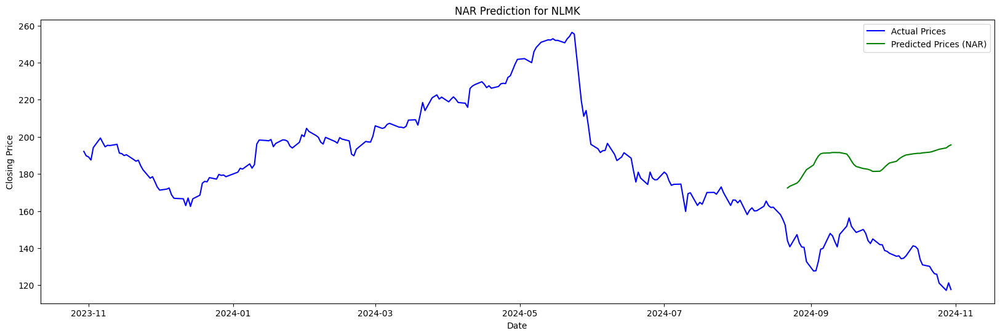

Results for NLMK:
  MSE = 2526.9372996853162
  MAE = 48.66604181563077
  RMSE = 50.268651261848234
  MAPE = 0.36%
  R² = -30.14003093717105



In [26]:
def nar_baseline(ticker_data, window_size=10):
    ticker_data = ticker_data.sort_values(by='TRADEDATE')
    ticker_data_values = ticker_data['CLOSE'].values
    dates = ticker_data['TRADEDATE'].values

    if len(ticker_data_values) <= window_size:
        print(f"Error: Ticker {ticker_data['TICKER'].iloc[0]} has insufficient data for the given window size. Skipping this ticker.")
        return None

    try:
        X, y = prepare_data(ticker_data_values, window_size)
        train_size = int(len(X) * 0.8)
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        model = SVR(kernel='rbf', C=1, epsilon=0.1)
        model.fit(X_train, y_train)

        predictions = model.predict(X_test)

        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        test_dates = dates[window_size + train_size:]

        plt.figure(figsize=(20, 6))
        plt.plot(dates, ticker_data_values, label='Actual Prices', color='blue')
        plt.plot(test_dates, predictions, label='Predicted Prices (NAR)', color='green')
        plt.xlabel('Date')
        plt.ylabel('Closing Price')
        plt.title(f'NAR Prediction for {ticker_data["TICKER"].iloc[0]}')
        plt.legend()
        plt.show()

        return mse, mae, rmse, mape, r2

    except Exception as e:
        print(f"Unexpected error for ticker {ticker_data['TICKER'].iloc[0]}: {e}")
        return None

nar_results = {}
for ticker in first_tier_tickers:
    ticker_data = data[data['TICKER'] == ticker]
    try:
        result = nar_baseline(ticker_data)
        if result is not None:
            mse, mae, rmse, mape, r2 = result
            nar_results[ticker] = {
                "MSE": mse,
                "MAE": mae,
                "RMSE": rmse,
                "MAPE": mape,
                "R²": r2
            }
            print(f"Results for {ticker}:")
            print(f"  MSE = {mse}")
            print(f"  MAE = {mae}")
            print(f"  RMSE = {rmse}")
            print(f"  MAPE = {mape:.2f}%")
            print(f"  R² = {r2}\n")
    except Exception as e:
        print(f"Error processing ticker {ticker}: {e}")


In [27]:
print("\nNAR Model Results Summary:")
for ticker, metrics in nar_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


NAR Model Results Summary:
SBER: MSE = 462.57846166850356, MAE = 19.371883745919508, RMSE = 21.50763728698491, MAPE = 0.08%, R² = -7.030575169443569
SBERP: MSE = 473.18803445389005, MAE = 19.657296713242076, RMSE = 21.752885658088907, MAPE = 0.08%, R² = -7.2315904101103055
ROSN: MSE = 4070.100097947614, MAE = 59.0932485801881, RMSE = 63.79733613519936, MAPE = 0.12%, R² = -8.020736894002527
SIBN: MSE = 6347.677073514817, MAE = 65.47138951724314, RMSE = 79.67231058225195, MAPE = 0.10%, R² = -2.905344496144455
NVTK: MSE = 71207.33622531907, MAE = 263.651785934254, RMSE = 266.84702776182286, MAPE = 0.27%, R² = -48.906684273303924
LKOH: MSE = 290543.9114600912, MAE = 460.6237474676258, RMSE = 539.0212532545365, MAPE = 0.07%, R² = -3.0194852328383464
GAZP: MSE = 21.145420677911957, MAE = 3.726116145257349, RMSE = 4.598415018015659, MAPE = 0.03%, R² = 0.49821724898263875
PLZL: MSE = 2473165.196637323, MAE = 1381.927812009241, RMSE = 1572.6300253515838, MAPE = 0.10%, R² = -2.832867151290002
T

### Обобщенные результаты разных моделей

In [28]:
print("\nSeasonal Naive Model Results Summary:")
for ticker, metrics in seasonal_naive_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")

print("\nHolt-Winters Model Results Summary:")
for ticker, metrics in holt_winters_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")

print("\nLinear Regression Model Results Summary:")
for ticker, metrics in linear_regression_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")

print("\nSARIMAX Model Results Summary:")
for ticker, metrics in sarimax_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")

print("\nProphet Model Results Summary:")
for ticker, metrics in prophet_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")

print("\nLSTM Model Results Summary:")
for ticker, metrics in lstm_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


print("\nGRU Model Results Summary:")
for ticker, metrics in gru_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


print("\nNAR Model Results Summary:")
for ticker, metrics in nar_results.items():
    print(f"{ticker}: MSE = {metrics['MSE']}, MAE = {metrics['MAE']}, RMSE = {metrics['RMSE']}, MAPE = {metrics['MAPE']:.2f}%, R² = {metrics['R²']}")


Seasonal Naive Model Results Summary:
SBER: MSE = 109.25573653846162, MAE = 8.87519230769231, RMSE = 10.452546892430648, MAPE = 0.03%, R² = -0.9033439475809286
SBERP: MSE = 108.09658461538463, MAE = 8.86423076923077, RMSE = 10.396950736412318, MAPE = 0.03%, R² = -0.8902564382302809
ROSN: MSE = 501.80668269230745, MAE = 17.706730769230766, RMSE = 22.401042000146052, MAPE = 0.04%, R² = -0.14986005096217436
SIBN: MSE = 1365.0027884615386, MAE = 28.42115384615384, RMSE = 36.94594414088695, MAPE = 0.04%, R² = 0.12898660742949475
NVTK: MSE = 1775.069230769231, MAE = 32.5923076923077, RMSE = 42.131570475941565, MAPE = 0.03%, R² = -0.26242838255039125
LKOH: MSE = 54894.596153846156, MAE = 186.82692307692307, RMSE = 234.2959584667353, MAPE = 0.03%, R² = 0.3034301195951359
GAZP: MSE = 53.80940192307693, MAE = 5.274423076923079, RMSE = 7.335489208163075, MAPE = 0.04%, R² = -0.30454278838277005
GMKN: MSE = 54.443061538461556, MAE = 6.080769230769231, RMSE = 7.378554163144806, MAPE = 0.06%, R² = -

# Выводы

## 1. **Сезонная наивная модель**
Модель дает плохие результаты для большинства акций. Например, SBER имеет очень низкие значения R² (-0.90), что свидетельствует о том, что модель не объясняет большую часть вариации данных.  
Для некоторых акций, таких как LKOH, MSE и RMSE очень высоки, что указывает на сильное расхождение между предсказаниями и реальными значениями.  
Однако для SNGS модель работает относительно лучше с MSE = 1.97 и R² = -0.67, но все равно далеко от идеальных значений.

## 2. **Модель Холта-Винтерса**
Модель также показывает слабые результаты для большинства акций, например, LKOH с MSE = 909465 и R² = -10.54 указывает на огромные ошибки прогнозирования.  
Некоторые другие акции, такие как SNGS, показывают лучшие результаты (MSE = 1.91 и R² = -0.63), но это все равно далеко от идеальных значений.

## 3. **Линейная регрессия**
Линейная регрессия показывает значительно лучшие результаты по сравнению с предыдущими моделями. Например, SBER имеет R² = 0.69, что свидетельствует о хорошем объяснении вариации данных.  
Особенно хорошо работает модель для ROSN и SIBN, с очень высокими значениями R² (0.84 и 0.89 соответственно), что означает, что линейная регрессия объясняет большую часть их колебаний.

## 4. **Модель SARIMAX**
Модель SARIMAX демонстрирует плохие результаты для большинства акций, особенно для таких как GMKN, с R² = -118834, что явно указывает на неадекватность модели для этой акции.  
Для ROSN и SIBN результаты несколько лучше, но R² все равно остается отрицательным, что также говорит о недостаточности модели.

## 5. **Модель Prophet**
Модель Prophet показывает некоторые улучшения по сравнению с предыдущими моделями, но все равно результаты для большинства акций остаются слабыми. Например, для SBER и SBERP R² равны примерно -3.2 и -3.0, что означает, что модель не объясняет колебания цен акций.  
Для SNGS результаты хорошие с MSE = 2.55, но все равно наблюдаются отрицательные значения R².

## 6. **Модель LSTM**
Модель LSTM показывает лучшие результаты по сравнению с большинством моделей. Например, для SBER и SBERP значения MSE составляют 57.78 и 65.28, а R² -0.003 и -0.136 соответственно, что также указывает на не совсем точные прогнозы, но она лучше, чем наивные и модели Холта-Винтерса.  
Для ROSN модель имеет R² = 0.39, что довольно неплохо для временных рядов.

---

# Общие выводы

- **Линейная регрессия** и **LSTM** показывают наилучшие результаты среди всех моделей, особенно для акций типа **SBER**, **ROSN**, **SIBN** и **LKOH**.  
- **SARIMAX** и **Prophet** имеют значительные трудности с точностью прогнозов, особенно для акций с сильными колебаниями.  
- **Seasonal Naive** и **Holt-Winters** показывают самые слабые результаты, особенно для акций с большими изменениями, таких как **LKOH** и **GMKN**.  
- Таким образом, для большинства акций **линейная регрессия** и **LSTM** являются более подходящими моделями, чем наивные подходы и методы, не учитывающие более сложные зависимости.
